In [3]:
import pickle
import pandas as pd
import numpy as np
import statistics
import matplotlib.pyplot as plt
import seaborn as sns
from pyproj import Proj, Geod
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split, ParameterGrid
from sklearn.metrics import mean_absolute_percentage_error, mean_squared_error, mean_absolute_error
import tensorflow as tf
from keras.models import Sequential, load_model
from keras.layers import Bidirectional, LSTM, Dense, TimeDistributed, Cropping1D
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras.optimizers import Adam
import os
import scipy.stats as stats


In [4]:
!pip list

Package                           Version
--------------------------------- ------------------
absl-py                           2.1.0
aiobotocore                       2.12.3
aiohttp                           3.9.5
aioitertools                      0.7.1
aiosignal                         1.2.0
alabaster                         0.7.16
altair                            5.0.1
anaconda-anon-usage               0.4.4
anaconda-catalogs                 0.2.0
anaconda-client                   1.12.3
anaconda-cloud-auth               0.5.1
anaconda-navigator                2.6.2
anaconda-project                  0.11.1
annotated-types                   0.6.0
anyio                             4.2.0
appdirs                           1.4.4
archspec                          0.2.3
argon2-cffi                       21.3.0
argon2-cffi-bindings              21.2.0
arrow                             1.2.3
astroid                           2.14.2
astropy                           6.1.0
astropy-iers-data 

In [14]:
### 95% prediction boundaries
### Modify LSTM parameters, sequence lengths to see if model improves.

In [2]:
# main sequence variables
seq_input_length = 30
seq_output_length = 20
seq_length = seq_input_length+seq_output_length

# seq = np.load("subset_sequences_after_shuffle.npy", allow_pickle=True)
seq = np.load("sequences_after_shuffle.npy", allow_pickle=True)
seq = seq.reshape(seq.shape[0]*seq.shape[1], seq.shape[2])
seq = seq[:,3:] 

In [3]:
# Selecting Features 3, 4, 5 for input (X) and Features 6, 7 for target (y)
X_seq = seq[:, [2, 3, 4]]  # Features for input (SOG, Heading, DateDiff)
y_seq = seq[:, [5, 6]]  # Features for target (dLat, dLong)

In [4]:
# Train the normalization for input features (X)
scaler_X = MinMaxScaler(feature_range=(0, 1))
scaler_X = scaler_X.fit(X_seq)

# Normalize the input features (X)
X_seq = scaler_X.transform(X_seq)

# Train the normalization for target features (y)
scaler_y = MinMaxScaler(feature_range=(0, 1))
scaler_y = scaler_y.fit(y_seq)

# Normalize the target features (y)
y_seq = scaler_y.transform(y_seq)

In [5]:
# Reshape back to sequence format
X_seq = X_seq.reshape(seq.shape[0] // seq_length, seq_length, X_seq.shape[1])
y_seq = y_seq.reshape(seq.shape[0] // seq_length, seq_length, y_seq.shape[1])

X = X_seq[:,0:seq_input_length,:]
y = y_seq[:,seq_input_length:seq_length,:]

# save/load scalers
pickle.dump(scaler_X, open("scaler_X.pkl", "wb"))
pickle.dump(scaler_y, open("scaler_y.pkl", "wb"))

In [6]:
# split train and test data by 70:30 ratio
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30)
X_test, X_val, y_test, y_val = train_test_split(X_test, y_test, test_size=0.50)   # 70 : 15 : 15


# save preprocessed data
np.save("X_train.npy", X_train)
np.save("X_test.npy", X_test)
np.save("X_val.npy", X_val)
np.save("y_train.npy", y_train)
np.save("y_test.npy", y_test)
np.save("y_val.npy", y_val)

In [7]:
# load preprocessed data
X_train = np.load("X_train.npy")
X_val = np.load("X_val.npy")
X_test = np.load("X_test.npy")
y_train = np.load("y_train.npy")
y_val = np.load("y_val.npy")
y_test = np.load("y_test.npy")


# Now X_train, X_val, X_test have only Features 3, 4, 5 and y_train, y_val, y_test have Features 6, 7
print(f"X_train shape: {X_train.shape}")  
print(f"X_val shape: {X_val.shape}") 
print(f"X_test shape: {X_test.shape}")  
print(f"y_train shape: {y_train.shape}")  
print(f"y_val shape: {y_val.shape}") 
print(f"y_test shape: {y_test.shape}")  

X_train shape: (55338, 30, 3)
X_val shape: (11859, 30, 3)
X_test shape: (11858, 30, 3)
y_train shape: (55338, 20, 2)
y_val shape: (11859, 20, 2)
y_test shape: (11858, 20, 2)


In [ ]:
# Define hyperparameter grid for Grid Search
grid = {
    'lstm_units_1': [64, 128],
    'lstm_units_2': [32, 64],
    'batch_size': [16, 32],
    'learning_rate': [0.001, 0.005],
    'epochs': [50, 100]
}
param_grid = ParameterGrid(grid)

# Create a directory to save models 
if not os.path.exists('models'):
    os.makedirs('models')

param_dict = {}

# Loop over each hyperparameter combination
for idx, params in enumerate(param_grid):
    param_dict[idx+1] = params

    print(f"Training model {idx + 1}/{len(param_grid)} with parameters: {params}")
    
    #BiLSTM model
    model = Sequential()
    model.add(Bidirectional(LSTM(params['lstm_units_1'], return_sequences=True), input_shape=(X_train.shape[1], X_train.shape[2])))
    model.add(Bidirectional(LSTM(params['lstm_units_2'], return_sequences=True)))
    model.add(Cropping1D(cropping=(X_train.shape[1] - y_train.shape[1], 0)))  # Crop to match y's time steps
    model.add(TimeDistributed(Dense(2)))  # Output layer with 2 units (for dLat and dLong) applied at each time step
    
    # Compile the model
    optimizer = Adam(learning_rate=params['learning_rate'])
    model.compile(optimizer=optimizer, loss='mse', metrics=['mae'])
    
    # Callbacks
    early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)
    model_checkpoint = ModelCheckpoint(f'models/model_{idx + 1}.keras', save_best_only=True, monitor='val_loss', mode='min')
    
    # Train the model
    history = model.fit(
        X_train, y_train,
        epochs=params['epochs'],
        batch_size=params['batch_size'],
        validation_data=(X_val, y_val),
        verbose=1,
        callbacks=[early_stopping, model_checkpoint]
    )
    
    # Save the final model
    model.save(f'models/final_model_{idx + 1}.keras')

In [ ]:
# Save dictionary to a file
with open('param_dict.pkl', 'wb') as f:
    pickle.dump(param_dict, f)

#####  Load the models, params, np files

In [7]:
# Load dictionary from the file
with open('param_dict.pkl', 'rb') as f:
    loaded_param_dict = pickle.load(f)
print(loaded_param_dict)

with open('scaler_y.pkl', 'rb') as s:
    scaler_y = pickle.load(s)
scaler_y

{1: {'batch_size': 16, 'epochs': 50, 'learning_rate': 0.001, 'lstm_units_1': 64, 'lstm_units_2': 32}, 2: {'batch_size': 16, 'epochs': 50, 'learning_rate': 0.001, 'lstm_units_1': 64, 'lstm_units_2': 64}, 3: {'batch_size': 16, 'epochs': 50, 'learning_rate': 0.001, 'lstm_units_1': 128, 'lstm_units_2': 32}, 4: {'batch_size': 16, 'epochs': 50, 'learning_rate': 0.001, 'lstm_units_1': 128, 'lstm_units_2': 64}, 5: {'batch_size': 16, 'epochs': 50, 'learning_rate': 0.005, 'lstm_units_1': 64, 'lstm_units_2': 32}, 6: {'batch_size': 16, 'epochs': 50, 'learning_rate': 0.005, 'lstm_units_1': 64, 'lstm_units_2': 64}, 7: {'batch_size': 16, 'epochs': 50, 'learning_rate': 0.005, 'lstm_units_1': 128, 'lstm_units_2': 32}, 8: {'batch_size': 16, 'epochs': 50, 'learning_rate': 0.005, 'lstm_units_1': 128, 'lstm_units_2': 64}, 9: {'batch_size': 16, 'epochs': 100, 'learning_rate': 0.001, 'lstm_units_1': 64, 'lstm_units_2': 32}, 10: {'batch_size': 16, 'epochs': 100, 'learning_rate': 0.001, 'lstm_units_1': 64, 'ls

MinMaxScaler()

##### Load Models & Specs

In [8]:
# Initialize a dictionary to store the loaded models and their specs
loaded_models = {}

# Load all saved models and store them in the dictionary
model_paths = glob.glob('models/model_*.keras')

for model_path in model_paths:
    print(f"\n\nLoading model from {model_path}")
    
    # Extract model index from the path
    base_name = os.path.basename(model_path)
    model_index = int(base_name.split('_')[1].split('.')[0])
    
    # Load the model and store it in the dictionary
    model = load_model(model_path)
    loaded_models[model_index] = {
        'model': model,
        'specs': loaded_param_dict[model_index]
    }

print("All models have been loaded and stored in the dictionary along with their specs.")



Loading model from models\model_1.keras


Loading model from models\model_10.keras


Loading model from models\model_11.keras


Loading model from models\model_12.keras


Loading model from models\model_13.keras


Loading model from models\model_14.keras


Loading model from models\model_15.keras


Loading model from models\model_16.keras


Loading model from models\model_17.keras


Loading model from models\model_18.keras


Loading model from models\model_19.keras


Loading model from models\model_2.keras


Loading model from models\model_20.keras


Loading model from models\model_21.keras


Loading model from models\model_22.keras


Loading model from models\model_23.keras


Loading model from models\model_24.keras


Loading model from models\model_25.keras


Loading model from models\model_26.keras


Loading model from models\model_27.keras


Loading model from models\model_28.keras


Loading model from models\model_29.keras


Loading model from models\model_3.keras


Loading mode

In [9]:
X_test = np.load("X_test.npy")
y_test = np.load("y_test.npy")

In [10]:
X_test.shape

(11858, 30, 3)

In [11]:
y_test.shape

(11858, 20, 2)

In [12]:
loaded_param_dict

{1: {'batch_size': 16,
  'epochs': 50,
  'learning_rate': 0.001,
  'lstm_units_1': 64,
  'lstm_units_2': 32},
 2: {'batch_size': 16,
  'epochs': 50,
  'learning_rate': 0.001,
  'lstm_units_1': 64,
  'lstm_units_2': 64},
 3: {'batch_size': 16,
  'epochs': 50,
  'learning_rate': 0.001,
  'lstm_units_1': 128,
  'lstm_units_2': 32},
 4: {'batch_size': 16,
  'epochs': 50,
  'learning_rate': 0.001,
  'lstm_units_1': 128,
  'lstm_units_2': 64},
 5: {'batch_size': 16,
  'epochs': 50,
  'learning_rate': 0.005,
  'lstm_units_1': 64,
  'lstm_units_2': 32},
 6: {'batch_size': 16,
  'epochs': 50,
  'learning_rate': 0.005,
  'lstm_units_1': 64,
  'lstm_units_2': 64},
 7: {'batch_size': 16,
  'epochs': 50,
  'learning_rate': 0.005,
  'lstm_units_1': 128,
  'lstm_units_2': 32},
 8: {'batch_size': 16,
  'epochs': 50,
  'learning_rate': 0.005,
  'lstm_units_1': 128,
  'lstm_units_2': 64},
 9: {'batch_size': 16,
  'epochs': 100,
  'learning_rate': 0.001,
  'lstm_units_1': 64,
  'lstm_units_2': 32},
 10: 

In [13]:
# Initialize a dictionary to store the predictions and transformed data
predictions = {}

# Reshape, inverse transform, and store the predictions for each model
for model_index, model_data in loaded_models.items():
    model = model_data['model']
    
    # Predict on the test set
    y_pred = model.predict(X_test)

    # Reshape and inverse transform
    y_test_flat = y_test.reshape(-1, 2)
    y_pred_flat = y_pred.reshape(-1, 2)
    y_test_inv = scaler_y.inverse_transform(y_test_flat)
    y_pred_inv = scaler_y.inverse_transform(y_pred_flat)

    # Store the predictions and transformed data
    predictions[model_index] = {
        'y_test_inv': y_test_inv,
        'y_pred_inv': y_pred_inv
    }

print("Predictions have been reshaped, inverse transformed, and stored.")

371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 6ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 6s 13ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 6s 15ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 7s 16ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 4s 9ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 6s 14ms/step
371/371 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms

In [14]:
# Initialize a list to store the results
results = []

# Calculate MAE and RMSE for each model
for model_index, model_data in loaded_models.items():
    model_specs = model_data['specs']
    y_test_inv = predictions[model_index]['y_test_inv']
    y_pred_inv = predictions[model_index]['y_pred_inv']
    
    # Calculate RMSE for both features
    rmse_feature_1 = np.sqrt(mean_squared_error(y_test_inv[:, 0], y_pred_inv[:, 0]))
    rmse_feature_2 = np.sqrt(mean_squared_error(y_test_inv[:, 1], y_pred_inv[:, 1]))
    rmse = (rmse_feature_1 + rmse_feature_2) / 2

    # Calculate MAE for both features
    mae_feature_1 = mean_absolute_error(y_test_inv[:, 0], y_pred_inv[:, 0])
    mae_feature_2 = mean_absolute_error(y_test_inv[:, 1], y_pred_inv[:, 1])
    mae = (mae_feature_1 + mae_feature_2) / 2

    # Append the results to the list
    results.append({
        'model': f'model_{model_index}.keras',
        'lstm_units_1': model_specs['lstm_units_1'],
        'lstm_units_2': model_specs['lstm_units_2'],
        'batch_size': model_specs['batch_size'],
        'learning_rate': model_specs['learning_rate'],
        'epochs': model_specs['epochs'],
        'MAE_feature_1': mae_feature_1,
        'MAE_feature_2': mae_feature_2,
        'Average_MAE': mae,
        'RMSE_feature_1': rmse_feature_1,
        'RMSE_feature_2': rmse_feature_2,
        'Average_RMSE': rmse
    })

# Create a DataFrame from the results
df_results = pd.DataFrame(results)

# Display the DataFrame

df_results

,model,lstm_units_1,lstm_units_2,batch_size,learning_rate,epochs,MAE_feature_1,MAE_feature_2,Average_MAE,RMSE_feature_1,RMSE_feature_2,Average_RMSE
0,model_1.keras,64,32,16,0.001,50,0.049626,0.120217,0.084922,0.262353,0.206633,0.234493
1,model_10.keras,64,64,16,0.001,100,0.048098,0.135214,0.091656,0.262024,0.210013,0.236018
2,model_11.keras,128,32,16,0.001,100,0.053133,0.138387,0.095760,0.263829,0.212773,0.238301
3,model_12.keras,128,64,16,0.001,100,0.051111,0.127917,0.089514,0.262939,0.205034,0.233986
4,model_13.keras,64,32,16,0.005,100,0.055582,0.174734,0.115158,0.264435,0.256391,0.260413
5,model_14.keras,64,64,16,0.005,100,0.058270,0.159667,0.108969,0.265033,0.233112,0.249072
6,model_15.keras,128,32,16,0.005,100,0.055848,0.167160,0.111504,0.264091,0.246386,0.255238
7,model_16.keras,128,64,16,0.005,100,0.063197,0.157451,0.110324,0.266700,0.229425,0.248063
8,model_17.keras,64,32,32,0.001,50,0.048710,0.123446,0.086078,0.262336,0.205015,0.233675
9,model_18.keras,64,64,32,0.001,50,0.047850,0.117484,0.082667,0.262201,0.200394,0.231297


In [13]:
df = df_results

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 32 entries, 0 to 31
Data columns (total 12 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   model           32 non-null     object 
 1   lstm_units_1    32 non-null     int64  
 2   lstm_units_2    32 non-null     int64  
 3   batch_size      32 non-null     int64  
 4   learning_rate   32 non-null     float64
 5   epochs          32 non-null     int64  
 6   MAE_feature_1   32 non-null     float64
 7   MAE_feature_2   32 non-null     float64
 8   Average_MAE     32 non-null     float64
 9   RMSE_feature_1  32 non-null     float64
 10  RMSE_feature_2  32 non-null     float64
 11  Average_RMSE    32 non-null     float64
dtypes: float64(7), int64(4), object(1)
memory usage: 3.1+ KB


In [18]:
csv_file_path = "model_metrics_results.csv"
# Save DataFrame to CSV
df.to_csv(csv_file_path, index=False)
print(f"DataFrame saved to {csv_file_path}")



DataFrame saved to model_metrics_results.csv


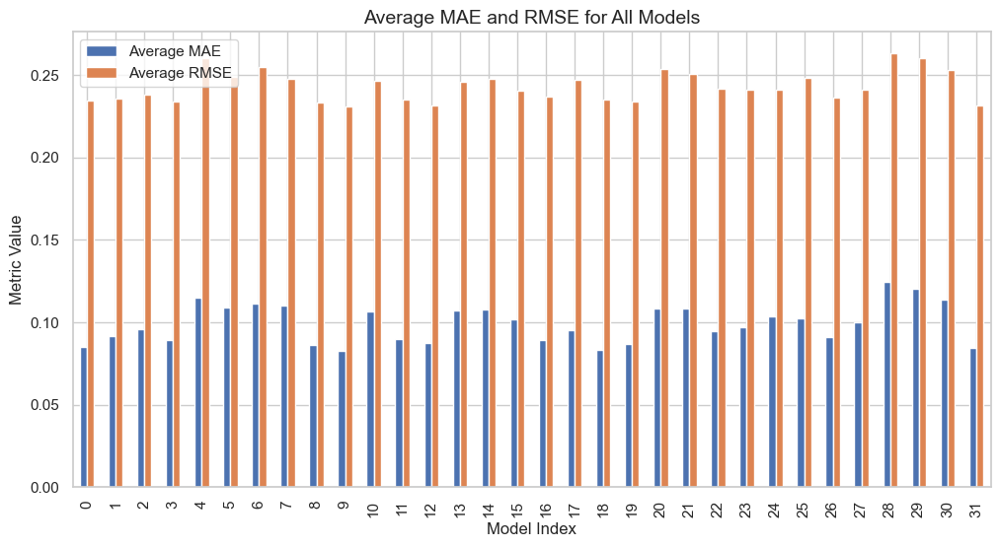

In [48]:

# Bar Plot: Average MAE and RMSE for All Models
fig, ax = plt.subplots(figsize=(12, 6))
df[['Average_MAE', 'Average_RMSE']].plot(kind='bar', ax=ax)
ax.set_title('Average MAE and RMSE for All Models', fontsize=14)
ax.set_xlabel('Model Index', fontsize=12)
ax.set_ylabel('Metric Value', fontsize=12)
ax.legend(['Average MAE', 'Average RMSE'])
plt.xticks(rotation=90)
#save_plot(fig, 'average_mae_rmse_bar.png')
plt.show()


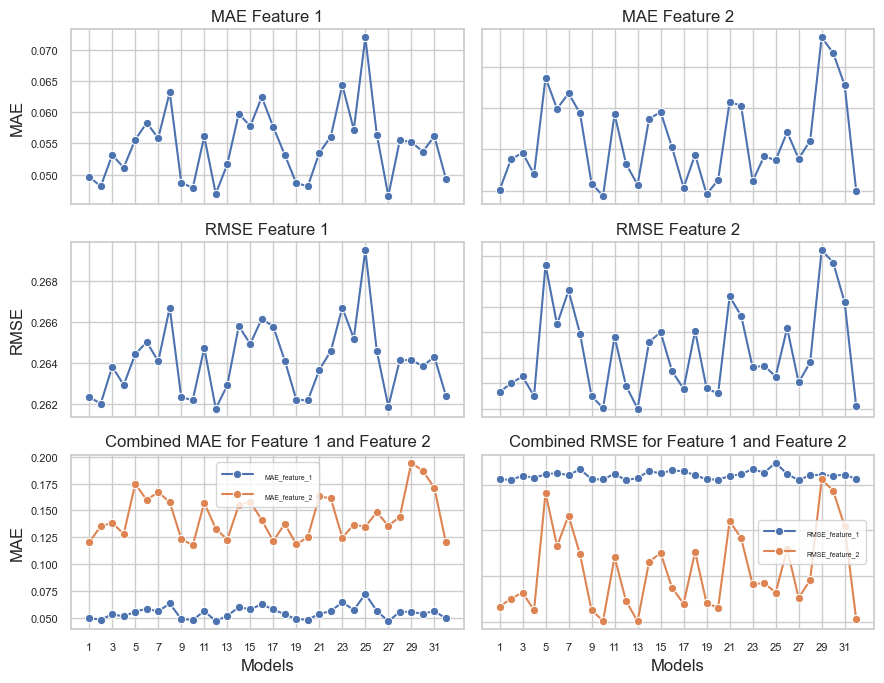

In [62]:
# Set the style of the visualization
sns.set(style="whitegrid")

# Create a DataFrame for plotting
df_melted = df.melt(id_vars=['model'], value_vars=['MAE_feature_1', 'MAE_feature_2', 'RMSE_feature_1', 'RMSE_feature_2'],
                    var_name='Metric', value_name='Value')

# Create a figure with 6 subplots
fig, axs = plt.subplots(3, 2, figsize=(9, 7))

# Plot MAE for Feature 1
sns.lineplot(data=df, x=df.index + 1, y='MAE_feature_1', marker='o', ax=axs[0, 0])
axs[0, 0].set_title('MAE Feature 1')
axs[0, 0].set_ylabel('MAE')
axs[0, 0].set_xticks(range(1, len(df) + 1, 2))

# Plot MAE for Feature 2
sns.lineplot(data=df, x=df.index + 1, y='MAE_feature_2', marker='o', ax=axs[0, 1])
axs[0, 1].set_title('MAE Feature 2')
axs[0, 1].set_ylabel('MAE')
axs[0, 1].set_xticks(range(1, len(df) + 1, 2))

# Plot RMSE for Feature 1
sns.lineplot(data=df, x=df.index + 1, y='RMSE_feature_1', marker='o', ax=axs[1, 0])
axs[1, 0].set_title('RMSE Feature 1')
axs[1, 0].set_ylabel('RMSE')
axs[1, 0].set_xticks(range(1, len(df) + 1, 2))

# Plot RMSE for Feature 2
sns.lineplot(data=df, x=df.index + 1, y='RMSE_feature_2', marker='o', ax=axs[1, 1])
axs[1, 1].set_title('RMSE Feature 2')
axs[1, 1].set_ylabel('RMSE')
axs[1, 1].set_xticks(range(1, len(df) + 1, 2))

# Plot combined MAE for both features
sns.lineplot(data=df_melted[df_melted['Metric'].isin(['MAE_feature_1', 'MAE_feature_2'])], x=df_melted[df_melted['Metric'].isin(['MAE_feature_1', 'MAE_feature_2'])].index % len(df) + 1,
             y='Value', hue='Metric', marker='o', ax=axs[2, 0])
axs[2, 0].set_title('Combined MAE for Feature 1 and Feature 2')
axs[2, 0].set_ylabel('MAE')
legend = axs[2, 0].legend(loc='best')
axs[2, 0].set_xticks(range(1, len(df) + 1, 2))
axs[2, 0].set_xlabel('Models')

# Plot combined RMSE for both features
sns.lineplot(data=df_melted[df_melted['Metric'].isin(['RMSE_feature_1', 'RMSE_feature_2'])], x=df_melted[df_melted['Metric'].isin(['RMSE_feature_1', 'RMSE_feature_2'])].index % len(df) + 1,
             y='Value', hue='Metric', marker='o', ax=axs[2, 1])
axs[2, 1].set_title('Combined RMSE for Feature 1 and Feature 2')
axs[2, 1].set_ylabel('RMSE')
legend = axs[2, 1].legend(loc='best')
axs[2, 1].set_xticks(range(1, len(df) + 1, 2))
axs[2, 1].set_xlabel('Models')

# Set the x-axis label only at the bottom of the graph
for ax in axs.flat:
    ax.label_outer()

# Adjust font size for tick labels and legends
for ax in axs.flat:
    ax.tick_params(axis='both', which='major', labelsize=8)
    if ax.get_legend() is not None:
        plt.setp(ax.get_legend().get_texts(), fontsize='5') # for legend text
        plt.setp(ax.get_legend().get_title(), fontsize='5') # for legend title

plt.tight_layout()
plt.show()


##### Haversines

In [16]:
class MAEH_Extension:
    
    p, geon = None, None # variables for cartographic transformations
    
    def __init__(self):
        self.p = Proj (
            proj="utm",
            zone=33,
            ellps="WGS84",
            south=True
        )    
        self.geod = Geod(ellps='WGS84', proj="utm", zone=33)
        
        
    def haversine_distance(lat1, lon1, lat2, lon2, units):
        if(units == 'k'):
            r = 6371 # Radius of earth in kilometers
        elif(units == 'm'):
            r = 6371000 # Radius of earth in meters
        else:
            r = 3956 # Radius of earth in miles            
        phi1 = np.radians(lat1)
        phi2 = np.radians(lat2)
        delta_phi = np.radians(lat2 - lat1)
        delta_lambda = np.radians(lon2 - lon1)
        a = np.sin(delta_phi / 2)**2 + np.cos(phi1) * np.cos(phi2) *   np.sin(delta_lambda / 2)**2
        res = r * (2 * np.arctan2(np.sqrt(a), np.sqrt(1 - a)))
        return np.round(res, 2)
    
    def true_and_predicted_distance(self, y, yhat, units):
        # calculate distance between true and predicted points
        if(y.ndim == 2):
            y = y.reshape(1, y.shape[0], y.shape[1])
        if(yhat.ndim == 2):
            yhat = yhat.reshape(1, yhat.shape[0], yhat.shape[1])
        dist = self.haversine_distance(y[:,:,0], y[:,:,1], yhat[:,:,0], yhat[:,:,1], units)
        return np.average(abs(dist)), dist
    
maehClassInst = MAEH_Extension

##### Haversine Distance for Individual Points

In [17]:
# Initialize a list to store the Haversine distances
haversine_results = []

# Calculate Haversine distance for each loaded model
for model_index, model_data in loaded_models.items():
    model_specs = model_data['specs']
    y_test_inv = predictions[model_index]['y_test_inv']
    y_pred_inv = predictions[model_index]['y_pred_inv']
    
    avg_dist, dist_array = maehClassInst.true_and_predicted_distance(maehClassInst, y_test_inv, y_pred_inv, 'k')

    # Append the results to the list
    haversine_results.append({
        'model': f'model_{model_index}.keras',
        'Model Specs': model_specs,
        'Average Haversine distance for each sequence (in km)': dist_array,
        'Overall Average Haversine Distance (in km)': avg_dist
    })

# Display the Haversine distances in the specified format
for result in haversine_results:
    print(f"Model: {result['model']}")
    print(f"Model Specs: {result['Model Specs']}")
    print(f"Average Haversine distance for each sequence (in km): {result['Average Haversine distance for each sequence (in km)']}")
    print(f"Overall Average Haversine Distance (in km): {result['Overall Average Haversine Distance (in km)']}\n")

Model: model_1.keras
Model Specs: {'batch_size': 16, 'epochs': 50, 'learning_rate': 0.001, 'lstm_units_1': 64, 'lstm_units_2': 32}
Average Haversine distance for each sequence (in km): [[6.63 5.1  5.17 ... 8.88 9.72 5.62]]
Overall Average Haversine Distance (in km): 15.638494138977903

Model: model_10.keras
Model Specs: {'batch_size': 16, 'epochs': 100, 'learning_rate': 0.001, 'lstm_units_1': 64, 'lstm_units_2': 64}
Average Haversine distance for each sequence (in km): [[ 9.68  9.94  9.77 ...  3.63  6.05 13.78]]
Overall Average Haversine Distance (in km): 17.00766507842807

Model: model_11.keras
Model Specs: {'batch_size': 16, 'epochs': 100, 'learning_rate': 0.001, 'lstm_units_1': 128, 'lstm_units_2': 32}
Average Haversine distance for each sequence (in km): [[ 5.56  4.88  5.12 ... 13.21 13.14 14.29]]
Overall Average Haversine Distance (in km): 17.676276817338508

Model: model_12.keras
Model Specs: {'batch_size': 16, 'epochs': 100, 'learning_rate': 0.001, 'lstm_units_1': 128, 'lstm_uni

In [65]:
df_haversine = pd.DataFrame(haversine_results)
df_haversine_avg = df_haversine[['model', 'Overall Average Haversine Distance (in km)']]

# Save the DataFrame to a CSV file
df_haversine_avg.to_csv('overall_average_haversine_distances.csv', index=False)

print("Overall average Haversine distances saved to 'overall_average_haversine_distances.csv'")


Overall average Haversine distances saved to 'overall_average_haversine_distances.csv'


##### Haversine Distance - Sequences

In [19]:
# Load all saved models and predict on the test set
model_paths = glob.glob('models/model_*.keras')
all_mape_results = []

modelSeq = {}
for model_path in model_paths:
    # Extract model index from the path
    base_name = os.path.basename(model_path)
    model_index = int(base_name.split('_')[1].split('.')[0])
    print(f"Model Specs: {loaded_param_dict[model_index]}")

    model = load_model(model_path)
    
    # Predict on the test set
    y_pred = model.predict(X_test)

    # Perform inverse transformation on y_test and y_pred without flattening
    y_test_inv = np.zeros_like(y_test)
    y_pred_inv = np.zeros_like(y_pred)

    # Inverse transform each sequence individually
    for i in range(y_test.shape[0]):  # Loop over all sequences
        y_test_inv[i] = scaler_y.inverse_transform(y_test[i])
        y_pred_inv[i] = scaler_y.inverse_transform(y_pred[i])


    # Calculate the Haversine distance for each sequence
    maeh_distances = []
    y_pred_inv_list = []

    for i in range(y_test_inv.shape[0]):  # Loop over all sequences
        avg_dist, dist_array = maehClassInst.true_and_predicted_distance(maehClassInst, y_test_inv[i], y_pred_inv[i], 'k')
        maeh_distances.append(avg_dist)
        y_pred_inv_list.append(y_pred_inv[i])

    # Convert maeh_distances to numpy array for further analysis if needed
    maeh_distances = np.array(maeh_distances)
    modelSeq[model_path] = y_pred_inv_list

    # Print or analyze distances for each sequence
    print(f"Average Haversine distance for each sequence (in km): {maeh_distances}")
    print(f"Overall Average Haversine Distance (in km): {np.mean(maeh_distances)}")

    # break

Model Specs: {'batch_size': 16, 'epochs': 50, 'learning_rate': 0.001, 'lstm_units_1': 64, 'lstm_units_2': 32}
371/371 ━━━━━━━━━━━━━━━━━━━━ 4s 10ms/step
Average Haversine distance for each sequence (in km): [ 6.1525 22.639  27.0495 ... 18.7935 10.7465  6.941 ]
Overall Average Haversine Distance (in km): 15.638494138977904
Model Specs: {'batch_size': 16, 'epochs': 100, 'learning_rate': 0.001, 'lstm_units_1': 64, 'lstm_units_2': 64}
371/371 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step
Average Haversine distance for each sequence (in km): [ 9.462  29.575  37.2815 ... 13.9045 12.9625  3.6985]
Overall Average Haversine Distance (in km): 17.00766507842806
Model Specs: {'batch_size': 16, 'epochs': 100, 'learning_rate': 0.001, 'lstm_units_1': 128, 'lstm_units_2': 32}
371/371 ━━━━━━━━━━━━━━━━━━━━ 5s 12ms/step
Average Haversine distance for each sequence (in km): [ 6.6195 23.6935 19.0395 ... 23.4575 14.328  10.7275]
Overall Average Haversine Distance (in km): 17.676276817338508
Model Specs: {'batch_size': 1

In [68]:

# Reinitialize the list for collecting overall average Haversine distances
all_mape_results = []

# Load all saved models and predict on the test set
model_paths = glob.glob('models/model_*.keras')

for model_path in model_paths:
    # Extract model index from the path
    base_name = os.path.basename(model_path)
    model_index = int(base_name.split('_')[1].split('.')[0])
    print(f"Model Specs: {loaded_param_dict[model_index]}")

    model = load_model(model_path)
    
    # Predict on the test set
    y_pred = model.predict(X_test)

    # Perform inverse transformation on y_test and y_pred without flattening
    y_test_inv = np.zeros_like(y_test)
    y_pred_inv = np.zeros_like(y_pred)

    # Inverse transform each sequence individually
    for i in range(y_test.shape[0]):  # Loop over all sequences
        y_test_inv[i] = scaler_y.inverse_transform(y_test[i])
        y_pred_inv[i] = scaler_y.inverse_transform(y_pred[i])

    # Calculate the Haversine distance for each sequence
    maeh_distances = []
    y_pred_inv_list = []

    for i in range(y_test_inv.shape[0]):  # Loop over all sequences
        avg_dist, dist_array = maehClassInst.true_and_predicted_distance(maehClassInst, y_test_inv[i], y_pred_inv[i], 'k')
        maeh_distances.append(avg_dist)
        y_pred_inv_list.append(y_pred_inv[i])

    # Convert maeh_distances to numpy array for further analysis if needed
    maeh_distances = np.array(maeh_distances)
    modelSeq[model_path] = y_pred_inv_list

    # Calculate overall average Haversine distance
    overall_avg_haversine_distance = np.mean(maeh_distances)
    
    # Append the results to all_mape_results
    all_mape_results.append({
        'model': f'model_{model_index}.keras',
        'Overall Average Haversine Distance (in km)': overall_avg_haversine_distance
    })

# Create a DataFrame from the results
df_s_haversine = pd.DataFrame(all_mape_results)

# Save the DataFrame to a CSV file
df_s_haversine.to_csv('s_overall_average_haversine_distances.csv', index=False)

print("Overall average Haversine distances saved to 'overall_average_haversine_distances.csv'")



Model Specs: {'batch_size': 16, 'epochs': 50, 'learning_rate': 0.001, 'lstm_units_1': 64, 'lstm_units_2': 32}
371/371 ━━━━━━━━━━━━━━━━━━━━ 3s 8ms/step
Model Specs: {'batch_size': 16, 'epochs': 100, 'learning_rate': 0.001, 'lstm_units_1': 64, 'lstm_units_2': 64}
371/371 ━━━━━━━━━━━━━━━━━━━━ 5s 11ms/step
Model Specs: {'batch_size': 16, 'epochs': 100, 'learning_rate': 0.001, 'lstm_units_1': 128, 'lstm_units_2': 32}
371/371 ━━━━━━━━━━━━━━━━━━━━ 9s 22ms/step
Model Specs: {'batch_size': 16, 'epochs': 100, 'learning_rate': 0.001, 'lstm_units_1': 128, 'lstm_units_2': 64}
371/371 ━━━━━━━━━━━━━━━━━━━━ 7s 17ms/step
Model Specs: {'batch_size': 16, 'epochs': 100, 'learning_rate': 0.005, 'lstm_units_1': 64, 'lstm_units_2': 32}
371/371 ━━━━━━━━━━━━━━━━━━━━ 5s 10ms/step
Model Specs: {'batch_size': 16, 'epochs': 100, 'learning_rate': 0.005, 'lstm_units_1': 64, 'lstm_units_2': 64}
371/371 ━━━━━━━━━━━━━━━━━━━━ 5s 13ms/step
Model Specs: {'batch_size': 16, 'epochs': 100, 'learning_rate': 0.005, 'lstm_units

In [52]:
import random 

# Specify the number of random keys you want to select
num_keys_to_select = 10

# Randomly select keys from the dictionary
random_keys = random.sample(list(modelSeq.keys()), num_keys_to_select)

# Create a new dictionary containing only the selected keys and their values
selected_dict = {key: modelSeq[key] for key in random_keys}

# Modify the dictionary to keep only the first 10 elements of each array
modified_model_dict = {key: value[:10] for key, value in selected_dict.items()}
modified_model_dict

{'models\\model_12.keras': [array([[-0.08232927, -0.07854459],
         [-0.0855014 , -0.09084082],
         [-0.08779351, -0.10078737],
         [-0.08922608, -0.1073129 ],
         [-0.08984686, -0.11180528],
         [-0.08968314, -0.11376537],
         [-0.08861895, -0.11508022],
         [-0.08666792, -0.11588373],
         [-0.08372092, -0.1171864 ],
         [-0.08009174, -0.11892735],
         [-0.07634658, -0.11676029],
         [-0.06401965, -0.15819007],
         [-0.06120908, -0.16174501],
         [-0.05736842, -0.15661956],
         [-0.05238171, -0.15237066],
         [-0.04782477, -0.14807306],
         [-0.04458443, -0.14310588],
         [-0.04251743, -0.13619077],
         [-0.04011617, -0.13186882],
         [-0.03274183, -0.14633211]], dtype=float32),
  array([[0.0704647 , 0.25681376],
         [0.07232022, 0.25061697],
         [0.07348675, 0.2444932 ],
         [0.07431218, 0.24110869],
         [0.07483063, 0.23858857],
         [0.07496025, 0.23722503],
       

##### Anomaly Detection

##### Prediction Interval Calculations

In [21]:
import scipy.stats as stats 
def calculate_prediction_interval(predicted_value, variance, sample_size, confidence_level=0.95): 

    """ 

    Calculate the prediction interval for a given predicted value. 

    """ 
    degrees_of_freedom = sample_size - 1 
    t_critical = stats.t.ppf((1 + confidence_level) / 2, degrees_of_freedom) 
    std_error = np.sqrt(variance * (1 + 1 / sample_size)) 
    lower_bound = predicted_value - t_critical * std_error 
    upper_bound = predicted_value + t_critical * std_error 
    return lower_bound, upper_bound 

  
sample_size = len(glob.glob('models/model_*.keras'))
# Initialize variables 
time_step_averages = [] 

# Loop over all time steps 
num_time_steps = len(y_test_inv[0])  # Assuming all sequences have the same number of time steps 
for time_step in range(num_time_steps): 
    print(f"\nPrediction Interval Calculation for Time Step {time_step + 1}") 
    dlatCountList = []  # Reset for this time step 
    dLongCountList = []  # Reset for this time step 
    for seqNo in range(len(y_pred_inv_list)):  # Loop over all sequences 
        modelPreds_dLat = [] 
        modelPreds_dLong = [] 
        # Loop over all model predictions 
        for model_path in model_paths: 
            pred_dLat, pred_dLong = modelSeq[model_path][seqNo][time_step]  # Get prediction for this time step 
            modelPreds_dLat.append(pred_dLat) 
            modelPreds_dLong.append(pred_dLong) 
            
         # Calculate variance 

        variance_dLat = np.var(modelPreds_dLat) 
        variance_dLong = np.var(modelPreds_dLong) 
        trueCount_dLat = 0 
        trueCount_dLong = 0 
        for pred_dLat, pred_dLong in zip(modelPreds_dLat, modelPreds_dLong): 
            # Calculate prediction intervals 
            up_low_dLat = calculate_prediction_interval(pred_dLat, variance_dLat, sample_size, confidence_level=0.95) 
            up_low_dLong = calculate_prediction_interval(pred_dLong, variance_dLong, sample_size, confidence_level=0.95) 
            # Check if actual values lie within prediction intervals 
            actual_dLat, actual_dLong = y_test_inv[seqNo][time_step] 
            if up_low_dLat[0] <= actual_dLat <= up_low_dLat[1]: 
                trueCount_dLat += 1 
            if up_low_dLong[0] <= actual_dLong <= up_low_dLong[1]: 
                trueCount_dLong += 1 

        # Append counts for this sequence 
        dlatCountList.append(trueCount_dLat) 
        dLongCountList.append(trueCount_dLong) 

    # Calculate average for this time step 

    avg_dLat = (sum(dlatCountList) / (sample_size * len(dlatCountList))) * 100 
    avg_dLong = (sum(dLongCountList) / (sample_size * len(dLongCountList))) * 100 
  
    print(f"Time Step {time_step + 1} - dLat Average: {avg_dLat:.2f}%, dLong Average: {avg_dLong:.2f}%") 

    # Store average for this time step 
    time_step_averages.append((avg_dLat, avg_dLong)) 

# Calculate overall average across all time steps 

overall_avg_dLat = sum(avg[0] for avg in time_step_averages) / num_time_steps 
overall_avg_dLong = sum(avg[1] for avg in time_step_averages) / num_time_steps 


print(f"\nOverall Average Percentage for dLat Across All Time Steps: {overall_avg_dLat:.2f}%")
print(f"Overall Average Percentage for dLong Across All Time Steps: {overall_avg_dLong:.2f}%") 


Prediction Interval Calculation for Time Step 1
Time Step 1 - dLat Average: 63.77%, dLong Average: 75.10%

Prediction Interval Calculation for Time Step 2
Time Step 2 - dLat Average: 62.99%, dLong Average: 74.77%

Prediction Interval Calculation for Time Step 3
Time Step 3 - dLat Average: 63.76%, dLong Average: 75.01%

Prediction Interval Calculation for Time Step 4
Time Step 4 - dLat Average: 64.20%, dLong Average: 74.71%

Prediction Interval Calculation for Time Step 5
Time Step 5 - dLat Average: 63.96%, dLong Average: 74.21%

Prediction Interval Calculation for Time Step 6
Time Step 6 - dLat Average: 63.67%, dLong Average: 73.66%

Prediction Interval Calculation for Time Step 7
Time Step 7 - dLat Average: 63.28%, dLong Average: 73.25%

Prediction Interval Calculation for Time Step 8
Time Step 8 - dLat Average: 63.03%, dLong Average: 72.93%

Prediction Interval Calculation for Time Step 9
Time Step 9 - dLat Average: 62.91%, dLong Average: 72.80%

Prediction Interval Calculation for 

Randomly selected time step: 20
Randomly selected sequences: [3739, 2077, 7901, 11277, 7559, 3914, 5419, 9338, 2387, 5920, 2873, 4674, 6824, 5674, 4233, 7786, 7190, 5917, 4977, 2498, 2180, 10315, 7386, 3784, 7255, 5701, 9889, 1423, 3795, 10612, 6240, 4366, 2917, 1449, 2103, 8771, 73, 3970, 7330, 8357, 7321, 6471, 11290, 11467, 212, 9275, 11622, 4681, 7013, 11082, 6605, 1224, 9333, 10246, 3094, 10639, 8988, 34, 7505, 4923, 7698, 4686, 6695, 1709, 11585, 10253, 4136, 9447, 10326, 1664, 2824, 5718, 11479, 8122, 5578, 11271, 741, 555, 7202, 6207, 1952, 4870, 5131, 9844, 863, 6300, 5841, 106, 2970, 8208, 5878, 4556, 11113, 7882, 10125, 7254, 2090, 5399, 3829, 7511]


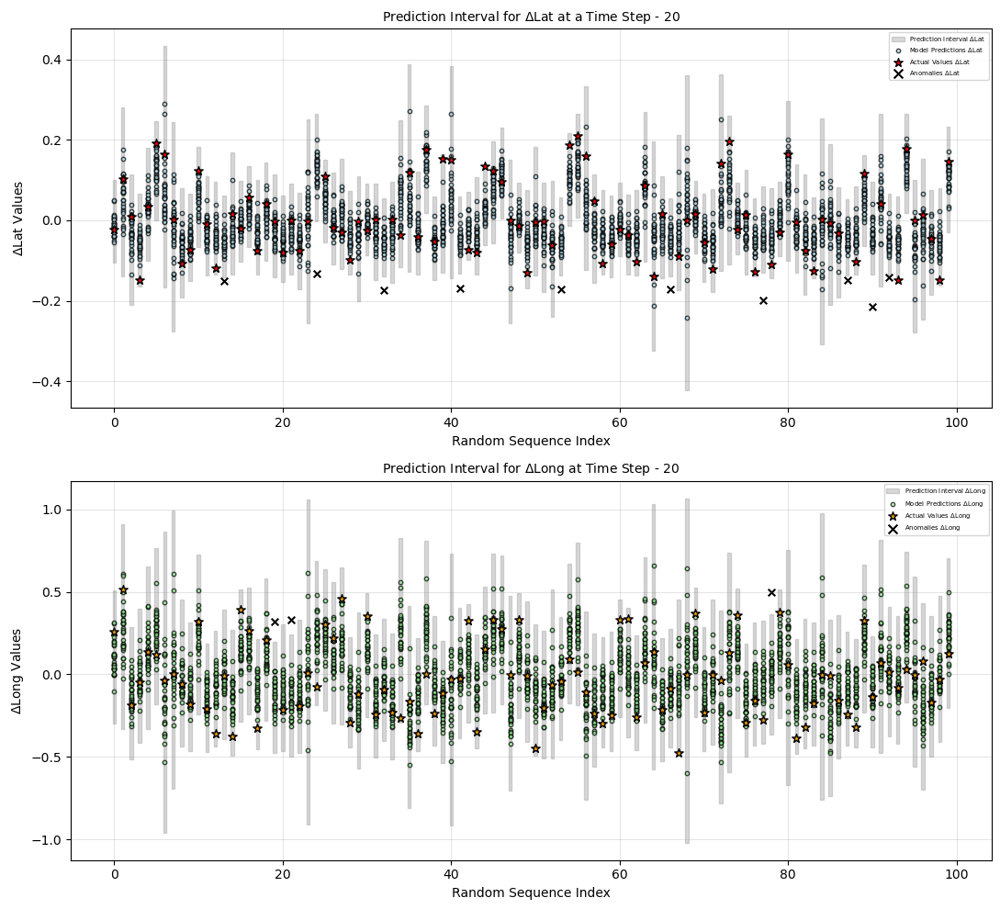

In [24]:


def visualize_random_time_step_dLat_dLong(num_random_sequences, sample_size, modelSeq, y_test_inv):
    """ 
    Visualize prediction intervals, model predictions, and actuals for dLat and dLong 
    for a randomly selected time step across randomly selected sequences. 

    Parameters: 
    - num_random_sequences: Number of random sequences to visualize 
    - sample_size: Number of models 
    - modelSeq: Dictionary containing model predictions for each sequence and time step 
    - y_test_inv: List of actual values for each sequence and time step 
    """ 

    # Randomly select a time step
   # num_time_steps = len(y_test_inv[0])  # Total number of time steps
    target_time_step = 19 #random.randint(0, num_time_steps - 1)  # Randomly select a time step
    print(f"Randomly selected time step: {target_time_step + 1}") 

    # Randomly select sequences
    random_sequences = random.sample(range(len(y_test_inv)), num_random_sequences) 
    print(f"Randomly selected sequences: {random_sequences}") 

    # Initialize containers for visualization
    prediction_intervals_dLat = []  # Prediction intervals for ΔLat
    model_predictions_dLat = []  # Model predictions for ΔLat
    actual_values_dLat = []  # Actual values for ΔLat

    prediction_intervals_dLong = []  # Prediction intervals for ΔLong
    model_predictions_dLong = []  # Model predictions for ΔLong
    actual_values_dLong = []  # Actual values for ΔLong

    # Gather data for the selected random sequences and time step
    for seq in random_sequences: 
        preds_dLat = [] 
        preds_dLong = [] 

        for model_path in model_paths: 
            pred_dLat, pred_dLong = modelSeq[model_path][seq][target_time_step]  # Get predictions for target time step
            preds_dLat.append(pred_dLat) 
            preds_dLong.append(pred_dLong) 

        # Calculate prediction intervals for ΔLat
        variance_dLat = np.var(preds_dLat) 
        lower_bound_dLat = np.min([calculate_prediction_interval(p, variance_dLat, sample_size)[0] for p in preds_dLat]) 
        upper_bound_dLat = np.max([calculate_prediction_interval(p, variance_dLat, sample_size)[1] for p in preds_dLat]) 
        prediction_intervals_dLat.append((lower_bound_dLat, upper_bound_dLat)) 

        # Calculate prediction intervals for ΔLong
        variance_dLong = np.var(preds_dLong) 
        lower_bound_dLong = np.min([calculate_prediction_interval(p, variance_dLong, sample_size)[0] for p in preds_dLong]) 
        upper_bound_dLong = np.max([calculate_prediction_interval(p, variance_dLong, sample_size)[1] for p in preds_dLong]) 
        prediction_intervals_dLong.append((lower_bound_dLong, upper_bound_dLong)) 

        # Store model predictions and actual values for ΔLat and ΔLong
        model_predictions_dLat.append(preds_dLat) 
        model_predictions_dLong.append(preds_dLong) 
        actual_values_dLat.append(y_test_inv[seq][target_time_step][0])  # ΔLat actual value
        actual_values_dLong.append(y_test_inv[seq][target_time_step][1])  # ΔLong actual value

    # Create subplots for dLat and dLong visualizations side by side
    #fig, axs = plt.subplots(1, 2, figsize=(20, 5))
    fig, axs = plt.subplots(2, 1, figsize=(11, 10))
    
    # Plot ΔLat visualization
    axs[0].grid(color='gray', linestyle='-', linewidth=0.5, alpha=0.3)
    
    for i, (lower, upper) in enumerate(prediction_intervals_dLat): 
        axs[0].fill_between([i - 0.2, i + 0.2], [lower], [upper], color="gray", alpha=0.3, label=r"Prediction Interval $\Delta$Lat " if i == 0 else "") 

    for i, preds in enumerate(model_predictions_dLat): 
        axs[0].scatter([i] * len(preds), preds, alpha=0.7, label=r"Model Predictions $\Delta$Lat" if i == 0 else "", edgecolors="black", color="lightblue", s=10) 

    anomalies_plotted = False
    for i, actual in enumerate(actual_values_dLat): 
        marker_style = "x" if actual < prediction_intervals_dLat[i][0] or actual > prediction_intervals_dLat[i][1] else "*"
        color_style = "black" if marker_style == "x" else "red"
        if marker_style == "x":
            axs[0].scatter([i], [actual], marker=marker_style, color=color_style, s=30)
            if not anomalies_plotted:
                axs[0].scatter([], [], marker="x", color="black", s=50, label=r"Anomalies $\Delta$Lat")
                anomalies_plotted = True
        else:
            axs[0].scatter([i], [actual], marker=marker_style, color=color_style, s=50, label=r"Actual Values $\Delta$Lat" if i == 0 else "", edgecolors="black")

    axs[0].set_title(rf"Prediction Interval for $\Delta$Lat at a Time Step - {target_time_step + 1}", fontsize=10) 
    axs[0].set_xlabel("Random Sequence Index", fontsize=10) 
    axs[0].set_ylabel(r"$\Delta$Lat Values", fontsize=10) 
    axs[0].legend(loc="upper right", fontsize=5) 

    # Plot ΔLong visualization
    axs[1].grid(color='gray', linestyle='-', linewidth=0.5, alpha=0.3)
    
    for i, (lower, upper) in enumerate(prediction_intervals_dLong): 
        axs[1].fill_between([i - 0.2, i + 0.2], [lower], [upper], color="gray", alpha=0.3, label=r"Prediction Interval $\Delta$Long" if i == 0 else "") 

    for i, preds in enumerate(model_predictions_dLong): 
        axs[1].scatter([i] * len(preds), preds, alpha=0.7, label=r"Model Predictions $\Delta$Long" if i == 0 else "", edgecolors="black", color="lightgreen", s=10) 

    anomalies_plotted = False
    for i, actual in enumerate(actual_values_dLong): 
        marker_style = "x" if actual < prediction_intervals_dLong[i][0] or actual > prediction_intervals_dLong[i][1] else "*"
        color_style = "black" if marker_style == "x" else "orange"
        if marker_style == "x":
            axs[1].scatter([i], [actual], marker=marker_style, color=color_style, s=30)
            if not anomalies_plotted:
                axs[1].scatter([], [], marker="x", color="black", s=50, label=r"Anomalies $\Delta$Long")
                anomalies_plotted = True
        else:
            axs[1].scatter([i], [actual], marker=marker_style, color=color_style, s=50, label=r"Actual Values $\Delta$Long" if i == 0 else "", edgecolors="black")

    axs[1].set_title(rf"Prediction Interval for $\Delta$Long at Time Step - {target_time_step + 1}", fontsize=10) 
    axs[1].set_xlabel("Random Sequence Index", fontsize=10) 
    axs[1].set_ylabel(r"$\Delta$Long Values", fontsize=10) 
    axs[1].legend(loc="upper right", fontsize=5) 

    plt.tight_layout() 
    plt.show() 

# Example: Visualize for 100 random sequences with the same random time step for both ΔLat and ΔLong
num_random_sequences = 100  #
visualize_random_time_step_dLat_dLong(num_random_sequences, sample_size, modelSeq, y_test_inv)

#### Ellipsoidal Prediction Region

Point = 2d array, dlat, dlong 
 center =  1d array with 2 element derived by getting the mean of the dlat and mean of the dlong

In [25]:
from scipy.spatial import ConvexHull
from scipy.stats import chi2
from shapely.geometry import Point, Polygon
from scipy.spatial import Delaunay

def calculate_epr(points, center):
    # Compute the Convex Hull of the points
    hull = ConvexHull(points)
    hull_vertices = points[hull.vertices]
    
    # Compute eigenvalues and eigenvectors of the Convex Hull vertices
    eig_val, eig_vec = np.linalg.eigh(np.cov(hull_vertices.T))
    
    # Set the confidence level for the EPR
    confidence_level = 0.95
    
    # Compute the radii of the EPR ellipsoid
    radii = np.sqrt(chi2.ppf(confidence_level, 2)) * np.sqrt(eig_val)
    
    # Generate an array of angles from 0 to 2π
    angles = np.linspace(0, 2 * np.pi, 100)
    
    # Compute points on the surface of the ellipsoid
    ellipsoid_points = np.vstack((radii[0] * np.cos(angles), radii[1] * np.sin(angles)))
    
    # Rotate the points by the eigenvectors
    ellipsoid_points = eig_vec.dot(ellipsoid_points).T
    
    # Create the EPR polygon
    epr = Polygon(ellipsoid_points + center)
    
    return epr, ellipsoid_points + center

def get_average_center(lst):
    if len(lst) == 0:
        return None  # Empty list case
    return sum(lst) / len(lst)

def regionCheck(ellipsoid_points, actual_point_2d, string):
    # Create the convex hull using scipy's ConvexHull
    hull = ConvexHull(ellipsoid_points)

    # Create a Delaunay triangulation from the hull points
    hull_delaunay = Delaunay(ellipsoid_points[hull.vertices])

    # Check if the actual_point_2d lies inside the convex hull
    is_inside = hull_delaunay.find_simplex(actual_point_2d) >= 0

    print(f"{string}: The point is inside the ellipsoid region: {is_inside[0]}")

    return is_inside


def elipseGraph(predicted_values, actual_values, epr_points, center_predicted):
    # Plotting
    plt.figure(figsize=(10, 6))

    # Plot predicted values
    plt.scatter(predicted_values[:, 0], predicted_values[:, 1], color='blue', label='Predicted Values')

    # Plot actual values
    plt.scatter(actual_values[:, 0], actual_values[:, 1], color='red', label='Actual Values')

    # Plot EPR ellipsoid
    plt.plot(epr_points[:, 0], epr_points[:, 1], color='green', label='EPR Ellipsoid')

    # Plot center of predicted values
    plt.scatter(center_predicted[0], center_predicted[1], color='black', marker='x', label='Center of Predicted Values')

    plt.xlabel('Latitude')
    plt.ylabel('Longitude')
    plt.title('EPR Ellipsoid with Predicted and Actual Values')
    plt.legend()
    plt.grid(True)
    plt.show()

tempStopSeq = 10
epr_dLat_dLong_Seq = {}
trueCount_RegionCheck_dLat_dLong = 0
falseCount_RegionCheck_dLat_dLong = 0
seqData = {}

# Loop over all sequences
# for seqNo in range(0, tempStopSeq):
for seqNo in range(len(y_pred_inv_list)): 
    print(f"\nEPR Calculation for Sequence {seqNo+1}")

    modelPreds_dLat_dLong = []

    # Get Actual
    actual_dLat_dLong = y_test_inv[seqNo][-1]
    actual_dLat_dLong = np.array([actual_dLat_dLong])

    # Loop over all Models Predictions
    for model_path in model_paths:
        # print(f"\nLoading model from {model_path}")
        lastPt = modelSeq[model_path][seqNo][-1] # Get Last Predicted dLat, dLong
        lastPT_dLat, lastPT_dLong = lastPt
        # print(f"Last Predicted dLat: {lastPT_dLat}, dLong: {lastPT_dLong}")

        # Store Predicted dLat, dLong for EPR Calc.
        modelPreds_dLat_dLong.append(lastPt)


    modelPreds_dLat_dLong = np.array(modelPreds_dLat_dLong)

    # Calculate the center of predicted values
    center_dLat_dLong = np.mean(modelPreds_dLat_dLong, axis=0)

    # Calculate EPR
    epr_polygon, ellipsoid_points = calculate_epr(modelPreds_dLat_dLong, center_dLat_dLong)

    # Check if Actual Lies in Ellipsoid Region
    regionCheck_dLat_dLong = regionCheck(ellipsoid_points, actual_dLat_dLong, 'dLat_dLong')

    epr_dLat_dLong_Seq[seqNo+1] = epr_polygon, regionCheck_dLat_dLong

    if regionCheck_dLat_dLong == True:
        trueCount_RegionCheck_dLat_dLong +=1
    else:
        falseCount_RegionCheck_dLat_dLong +=1

    seqData[seqNo+1] = modelPreds_dLat_dLong, actual_dLat_dLong, ellipsoid_points, center_dLat_dLong

acc_EPR = trueCount_RegionCheck_dLat_dLong/len(y_pred_inv_list)


EPR Calculation for Sequence 1
dLat_dLong: The point is inside the ellipsoid region: True

EPR Calculation for Sequence 2
dLat_dLong: The point is inside the ellipsoid region: True

EPR Calculation for Sequence 3
dLat_dLong: The point is inside the ellipsoid region: True

EPR Calculation for Sequence 4
dLat_dLong: The point is inside the ellipsoid region: True

EPR Calculation for Sequence 5
dLat_dLong: The point is inside the ellipsoid region: True

EPR Calculation for Sequence 6
dLat_dLong: The point is inside the ellipsoid region: False

EPR Calculation for Sequence 7
dLat_dLong: The point is inside the ellipsoid region: True

EPR Calculation for Sequence 8
dLat_dLong: The point is inside the ellipsoid region: False

EPR Calculation for Sequence 9
dLat_dLong: The point is inside the ellipsoid region: True

EPR Calculation for Sequence 10
dLat_dLong: The point is inside the ellipsoid region: True

EPR Calculation for Sequence 11
dLat_dLong: The point is inside the ellipsoid region: 

In [29]:
#check overall coverage
acc_EPR

0.8256872997132737

In [30]:
print (f"The validation ratio with true_values within the EPR is:  {acc_EPR}")

The validation ratio with true_values within the EPR is:  0.8256872997132737


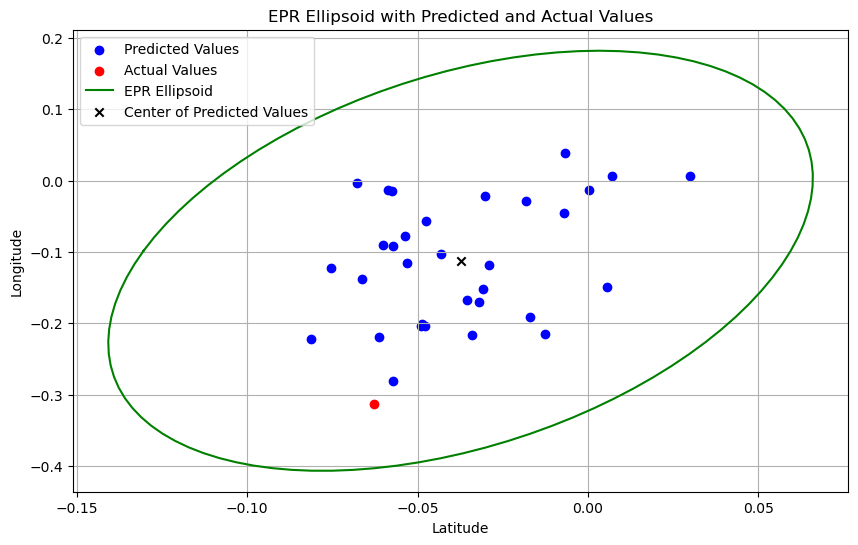

In [31]:
graphSeq = 1500

elipseGraph(seqData[graphSeq][0], seqData[graphSeq][1], seqData[graphSeq][2], seqData[graphSeq][3])

<>:29: SyntaxWarning: invalid escape sequence '\D'
<>:30: SyntaxWarning: invalid escape sequence '\D'
<>:29: SyntaxWarning: invalid escape sequence '\D'
<>:30: SyntaxWarning: invalid escape sequence '\D'
C:\Users\a142105\AppData\Local\Temp\ipykernel_59352\1819038906.py:29: SyntaxWarning: invalid escape sequence '\D'
  plt.xlabel('$\Delta$Lat')
C:\Users\a142105\AppData\Local\Temp\ipykernel_59352\1819038906.py:30: SyntaxWarning: invalid escape sequence '\D'
  plt.ylabel('$\Delta$Long')


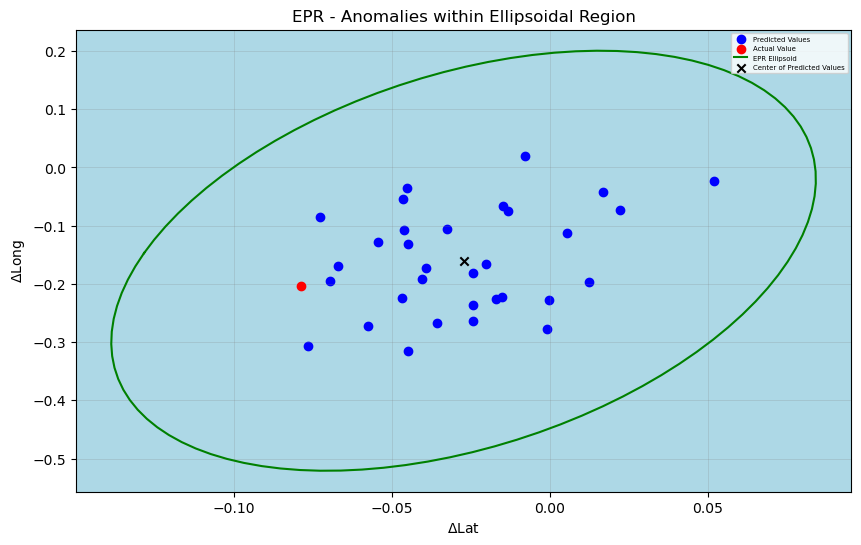

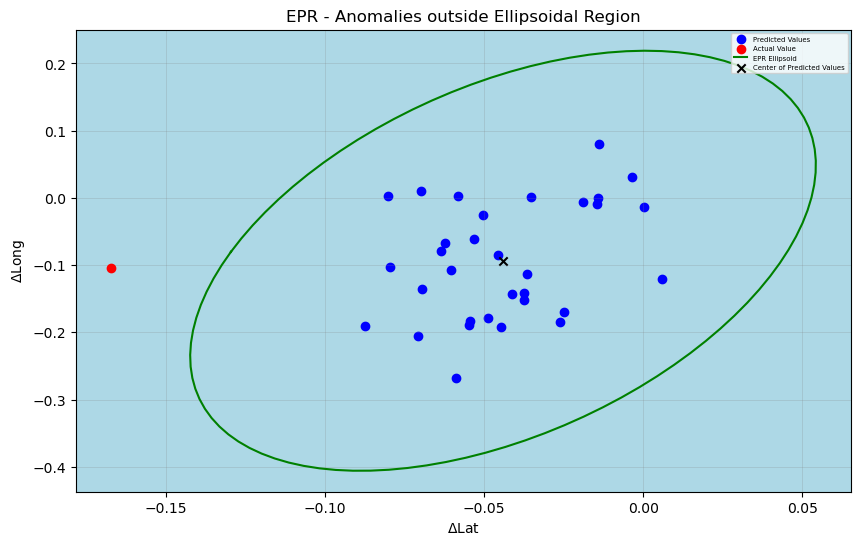

In [32]:
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import ConvexHull, Delaunay
from scipy.stats import chi2
from shapely.geometry import Polygon

def visualize_random_scenarios(seqData, epr_dLat_dLong_Seq):
    # Choose random sequence for the two cases
    inside_scenarios = [seqNo for seqNo, data in epr_dLat_dLong_Seq.items() if data[1]]
    outside_scenarios = [seqNo for seqNo, data in epr_dLat_dLong_Seq.items() if not data[1]]
    if inside_scenarios:
        random_inside_seq = np.random.choice(inside_scenarios)
        visualize_scenario(seqData, random_inside_seq, "EPR - Anomalies within Ellipsoidal Region")
    if outside_scenarios:
        random_outside_seq = np.random.choice(outside_scenarios)
        visualize_scenario(seqData, random_outside_seq, "EPR - Anomalies outside Ellipsoidal Region")

def visualize_scenario(seqData, seqNo, title):
    predicted_values, actual_values, epr_points, center_predicted = seqData[seqNo]
    plt.figure(figsize=(10, 6))
    # Plot predicted values
    plt.scatter(predicted_values[:, 0], predicted_values[:, 1], color='blue', label='Predicted Values')
    # Plot actual value
    plt.scatter(actual_values[0, 0], actual_values[0, 1], color='red', label='Actual Value', zorder=5)
    # Plot EPR ellipsoid
    plt.plot(epr_points[:, 0], epr_points[:, 1], color='green', label='EPR Ellipsoid')
    # Plot center of predicted values
    plt.scatter(center_predicted[0], center_predicted[1], color='black', marker='x', label='Center of Predicted Values')
    plt.xlabel('$\Delta$Lat')
    plt.ylabel('$\Delta$Long')
    plt.title(f'{title}')
    plt.gca().set_facecolor('lightblue')
    plt.legend(loc="upper right", fontsize=5) 
    plt.grid(color='gray', linestyle='-', linewidth=0.5, alpha=0.3)
    plt.show()

# Visualize random scenarios
visualize_random_scenarios(seqData, epr_dLat_dLong_Seq)



Inside scenarios: [1, 2, 3, 4, 5, 7, 9, 10, 12, 13, 14, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 39, 40, 41, 42, 43, 44, 45, 46, 48, 49, 50, 51, 52, 53, 54, 55, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 82, 83, 84, 85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95, 96, 98, 99, 100, 102, 103, 104, 105, 106, 108, 109, 110, 112, 113, 114, 115, 116, 117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 128, 130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 141, 142, 143, 145, 146, 150, 151, 152, 153, 154, 158, 159, 161, 164, 165, 166, 168, 170, 171, 172, 173, 174, 175, 176, 177, 178, 180, 181, 182, 183, 185, 187, 188, 189, 190, 191, 192, 193, 194, 195, 196, 197, 198, 199, 200, 201, 202, 203, 204, 205, 206, 207, 208, 209, 210, 212, 214, 215, 216, 217, 219, 220, 221, 223, 224, 225, 226, 227, 228, 229, 230, 231, 232, 233, 234, 235, 236, 238, 239, 240, 241, 242, 243, 245, 247, 248, 249, 250, 251, 252, 253, 255, 2

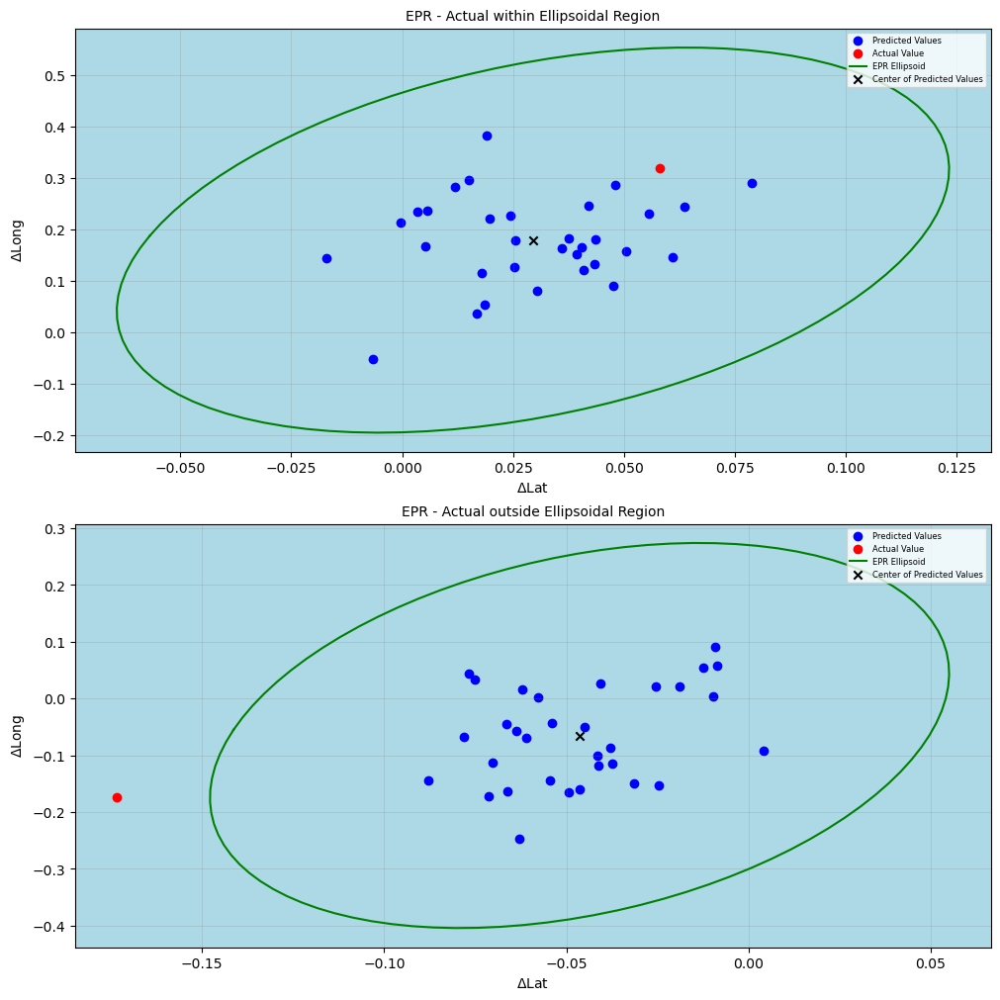

In [241]:
def visualize_single_sequence(seqData, epr_dLat_dLong_Seq):
    # Filter sequences
    inside_scenarios = [seqNo for seqNo, data in epr_dLat_dLong_Seq.items() if data[1]]
    outside_scenarios = [seqNo for seqNo, data in epr_dLat_dLong_Seq.items() if not data[1]]

    # Debug: Check available scenarios
    print(f"Inside scenarios: {inside_scenarios}")
    print(f"Outside scenarios: {outside_scenarios}")

    # Ensure both scenarios exist
    if not inside_scenarios or not outside_scenarios:
        print("Error: Both inside and outside scenarios must exist to create a comparison.")
        return

    # Randomly pick one sequence for each case
    random_inside_seq = np.random.choice(inside_scenarios)
    random_outside_seq = np.random.choice(outside_scenarios)

    print(f"Selected inside sequence: {random_inside_seq}")
    print(f"Selected outside sequence: {random_outside_seq}")

    # Create a figure with two subplots
    fig, axes = plt.subplots(2, 1, figsize=(10, 10), constrained_layout=True)

    # Plot inside scenario
    visualize_scenario_subplot(seqData, random_inside_seq, "EPR - Actual within Ellipsoidal Region", axes[0])

    # Plot outside scenario
    visualize_scenario_subplot(seqData, random_outside_seq, "EPR - Actual outside Ellipsoidal Region", axes[1])

    # Add a global title
    #plt.suptitle("EPR Anomaly Analysis for Single Sequence", fontsize=16)
    plt.show()

def visualize_scenario_subplot(seqData, seqNo, title, ax):
    # Extract data for the selected sequence
    try:
        predicted_values, actual_values, epr_points, center_predicted = seqData[seqNo]
    except KeyError:
        print(f"Error: Sequence {seqNo} not found in seqData.")
        return

    # Debug: Check extracted data
    #print(f"Predicted values for sequence {seqNo}: {predicted_values}")
    print(f"Actual value for sequence {seqNo}: {actual_values}")
   # print(f"EPR points for sequence {seqNo}: {epr_points}")
    print(f"Center of predicted values for sequence {seqNo}: {center_predicted}")

    # Plot predicted values
    ax.scatter(predicted_values[:, 0], predicted_values[:, 1], color='blue', label='Predicted Values')

    # Plot actual value
    ax.scatter(actual_values[0, 0], actual_values[0, 1], color='red', label='Actual Value', zorder=5)

    # Plot EPR ellipsoid
    ax.plot(epr_points[:, 0], epr_points[:, 1], color='green', label='EPR Ellipsoid')

    # Plot center of predicted values
    ax.scatter(center_predicted[0], center_predicted[1], color='black', marker='x', label='Center of Predicted Values')

    # Add labels and title
    ax.set_xlabel(r'$\Delta$Lat')
    ax.set_ylabel(r'$\Delta$Long')
    ax.set_title(title, fontsize=10)
    ax.set_facecolor('lightblue')
    ax.legend(loc="upper right", fontsize=6)
    ax.grid(color='gray', linestyle='-', linewidth=0.5, alpha=0.3)

# Call the function to visualize a single sequence for inside and outside cases
visualize_single_sequence(seqData, epr_dLat_dLong_Seq)


##### EPR - Alternative sample & coverage

In [130]:
import numpy as np
from scipy.spatial import ConvexHull
from scipy.stats import chi2
from shapely.geometry import Point,Polygon
def calculate_epr(points,center):
    #Compute the Convex Hull of the points
    hull=ConvexHull(points)
    hull_vertices=points[hull.vertices]
    #Compute eigenvalues and eigenvectors of the Convex Hull vertices
    eig_val,eig_vec=np.linalg.eigh(np.cov(hull_vertices.T))
    #Set the confidence level for the EPR
    confidence_level=0.95
    #Compute the radii of the EPR ellipsoid
    radii=np.sqrt(chi2.ppf(confidence_level,2))*np.sqrt(eig_val)
    #Generate an array of angles from 0 to 2π
    angles=np.linspace(0,2*np.pi,100)
    #Compute points on the surface of the ellipsoid
    ellipsoid_points=np.vstack((radii[0]*np.cos(angles),radii[1]*np.sin(angles)))
    #Rotate the points by the eigenvectors
    ellipsoid_points=eig_vec.dot(ellipsoid_points).T
    #Create the EPR polygon
    epr=Polygon(ellipsoid_points+center)
    return epr

#Initialize counters for each time step
time_step_counts=[]
time_step_inside_counts=[]
#Determine the maximum sequence length
max_sequence_length=max(len(seq)for seq in y_test_inv)
#Initialize counters for each time step
time_step_counts=np.zeros(max_sequence_length)
time_step_inside_counts=np.zeros(max_sequence_length)
#Loop over all sequences
for seqNo in range(len(y_pred_inv_list)):
    sequence_length=len(y_test_inv[seqNo])
    #Loop over all time steps in the sequence
    for time_step in range(sequence_length):
        #Collect the predicted points from all models for the current time step
        modelPreds_dLat_dLong=[]
        for model_path in model_paths:
            point=modelSeq[model_path][seqNo][time_step]
            modelPreds_dLat_dLong.append(point)
        modelPreds_dLat_dLong=np.array(modelPreds_dLat_dLong)
        #Calculate the center of predicted values
        center_dLat_dLong=np.mean(modelPreds_dLat_dLong,axis=0)
        #Calculate EPR
        epr_polygon=calculate_epr(modelPreds_dLat_dLong,center_dLat_dLong)
        #Get the actual point
        actual_dLat_dLong=y_test_inv[seqNo][time_step]
        #Check if the actual point lies within the EPR
        point=Point(actual_dLat_dLong)
        if epr_polygon.contains(point):
            time_step_inside_counts[time_step]+=1
        time_step_counts[time_step]+=1


#Calculate and print coverage probability for each time step
for time_step in range(max_sequence_length):
    if time_step_counts[time_step]>0:
        coverage_probability=(time_step_inside_counts[time_step]/time_step_counts[time_step])*100
        print(f"Time Step {time_step+1}: Coverage Probability = {coverage_probability:.2f}%")
    else:
        print(f"Time Step {time_step+1}: No data available.")
#Calculate and print overall coverage probability
total_inside=np.sum(time_step_inside_counts)
total_counts=np.sum(time_step_counts)
overall_coverage_probability=(total_inside/total_counts)*100
print(f"\nOverall Coverage Probability: {overall_coverage_probability:.2f}%")


Time Step 1: Coverage Probability = 88.62%
Time Step 2: Coverage Probability = 88.18%
Time Step 3: Coverage Probability = 88.83%
Time Step 4: Coverage Probability = 88.61%
Time Step 5: Coverage Probability = 87.85%
Time Step 6: Coverage Probability = 87.69%
Time Step 7: Coverage Probability = 87.43%
Time Step 8: Coverage Probability = 87.52%
Time Step 9: Coverage Probability = 88.00%
Time Step 10: Coverage Probability = 87.96%
Time Step 11: Coverage Probability = 88.23%
Time Step 12: Coverage Probability = 87.80%
Time Step 13: Coverage Probability = 87.59%
Time Step 14: Coverage Probability = 87.28%
Time Step 15: Coverage Probability = 87.00%
Time Step 16: Coverage Probability = 86.07%
Time Step 17: Coverage Probability = 81.73%
Time Step 18: Coverage Probability = 80.29%
Time Step 19: Coverage Probability = 80.06%
Time Step 20: Coverage Probability = 82.57%

Overall Coverage Probability: 86.46%


#### Conformal Prediction Region

In [36]:
### CPR LOGIC
"""
1. Loop over all or specified sequences to get all 32 models predictions for the 20 timesteps.
2. Store all 20 predictions for each model for each specified sequence.
3. To calculate CPR, Actuals and Prediction from each model have to be of same shape.
4. To get that we create a loop with range of 32(no of models). In each loop iteration:
    4a. We get the model No.
    4b. We create another loop to go over each sequence. For each sequence:
        4b1. We get the prediction for the model No from point 4a.
        4b2. All predictions from the model will be stored in a numpy array to represent same format.
    4c. We caclulate the mid point by dividing the total number of Sequences by 2.
    4d. The mid point is then used to divide the test set and prediction set into two parts.
    4e. CPR is then calculated by using the calibration and new sets.
5. Step 4 is repeated until we get the CPR for all models.
6. In the end, combined CPR is calculated for all models.
"""

'\n1. Loop over all or specified sequences to get all 32 models predictions for the 20 timesteps.\n2. Store all 20 predictions for each model for each specified sequence.\n3. To calculate CPR, Actuals and Prediction from each model have to be of same shape.\n4. To get that we create a loop with range of 32(no of models). In each loop iteration:\n    4a. We get the model No.\n    4b. We create another loop to go over each sequence. For each sequence:\n        4b1. We get the prediction for the model No from point 4a.\n        4b2. All predictions from the model will be stored in a numpy array to represent same format.\n    4c. We caclulate the mid point by dividing the total number of Sequences by 2.\n    4d. The mid point is then used to divide the test set and prediction set into two parts.\n    4e. CPR is then calculated by using the calibration and new sets.\n5. Step 4 is repeated until we get the CPR for all models.\n6. In the end, combined CPR is calculated for all models.\n'

In [132]:
# Function to calculate Euclidean distances for each step in each sample
def calculate_euclidean_distances(predictions, actuals):
    distances = np.sqrt(np.sum((predictions - actuals) ** 2, axis=-1))
    return distances

tempStopSeq = 50
pointTotal = 20

seqData = {}
seqActuals = []

# Loop over all sequences
# for seqNo in range(0, tempStopSeq): # o Run for Specified Sequences
for seqNo in range(len(y_pred_inv_list)): # to Run for All Sequences
    # print(f"\nCPR Calculation for Sequence {seqNo+1}")

    modelPreds = {}
    modelPreds_dLat_dLong = []
    modelCount = 0

    # Get Actual
    actualPoint = y_test_inv[seqNo][-pointTotal:]
    # actualPoint = np.array([actualPoint])

    # Loop over all Models Predictions
    for model_path in model_paths:
        # print(f"\nLoading model from {model_path}")
        lastPt = modelSeq[model_path][seqNo][-pointTotal:] # Get Specified Predicted dLat, dLong

        modelPreds[modelCount] = lastPt

        # Store Predicted dLat, dLong for EPR Calc.
        modelPreds_dLat_dLong.append(lastPt)

        modelCount+=1

    modelPreds_dLat_dLong = np.array(modelPreds_dLat_dLong)
    
    seqActuals.append(actualPoint)

    seqData[seqNo] = modelPreds

seqActuals = np.array(seqActuals)

In [133]:
modelThresholds = []
for modelNo in range(0, 32):
    print(f"\nCalculation for Model {modelNo+1}")
    modelPredAcrossSeq = []
    # for seqNo in range(0, tempStopSeq): # to Run for Specified Sequences - to test 
    for seqNo in range(len(y_pred_inv_list)):  # to Run for All Sequences - to test
        # print(seqNo)
        modelPredAcrossSeq.append(seqData[seqNo][modelNo])

    # Split the test set by 50% to form the calibration set
    seqMid = int(len(modelPredAcrossSeq)/2)
    modelPredAcrossSeq = np.array(modelPredAcrossSeq)
    calibration_set_predictions_model = modelPredAcrossSeq[:seqMid]
    calibration_set_actuals = seqActuals[:seqMid]

    # Remaining data for new predictions and actuals
    new_prediction_model = modelPredAcrossSeq[seqMid:]
    new_actual = seqActuals[seqMid:]

    # Compute nonconformity scores across all samples and steps
    nonconformity_scores_model = calculate_euclidean_distances(calibration_set_predictions_model.astype(float), calibration_set_actuals.astype(float))

    alpha = 0.05
    # Calculate stepwise thresholds across samples for each step
    thresholds_stepwise_model = np.quantile(nonconformity_scores_model, 1 - alpha, axis=0)

    # Compute nonconformity scores for the new prediction against the new actual
    new_scores_model = calculate_euclidean_distances(new_prediction_model.reshape(seqMid, pointTotal, 2), new_actual.reshape(seqMid, pointTotal, 2)).flatten()

    # Comparing new prediction scores against the thresholds for each step
    is_within_threshold_model = new_scores_model.reshape(seqMid, pointTotal) <= thresholds_stepwise_model
    modelThresholds.append(is_within_threshold_model)
    # Calculate coverage probability 
    coverage_probability_model = np.mean(is_within_threshold_model)

    # Output the thresholds and whether the new scores are within these thresholds for each step
    print(f"Model {modelNo+1} Thresholds Stepwise:", thresholds_stepwise_model)
    print(f"Model {modelNo+1} Is Within Threshold:", is_within_threshold_model)
    print(f"Model {modelNo+1} New Scores:", new_scores_model.reshape(seqMid, pointTotal))
    print(f"Model {modelNo+1} Coverage Probability: {coverage_probability_model:.2f}")
    # break

# Sum each sub-array
sub_array_sums = [np.sum(sub_array) for sub_array in modelThresholds]
# Get size of each sub-array
sub_array_size = [sub_array.size for sub_array in modelThresholds]
# Calculate overall coverage probability across all models
overall_coverage_probability = np.sum(sub_array_sums)/np.sum(sub_array_size)
print(f"\nOverall Coverage Probability: {overall_coverage_probability:.4f}")


Calculation for Model 1
Model 1 Thresholds Stepwise: [0.33825846 0.32971367 0.32631834 0.32469946 0.32925578 0.32932155
 0.32666982 0.33142168 0.33576496 0.33889584 0.34264781 0.34948638
 0.35541943 0.36341977 0.36968549 0.37243251 0.37332251 0.36540399
 0.35385466 0.3908152 ]
Model 1 Is Within Threshold: [[ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 ...
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]
 [ True  True  True ...  True  True  True]]
Model 1 New Scores: [[0.14845438 0.12420395 0.11634367 ... 0.12164576 0.13402626 0.13624006]
 [0.12262418 0.15126786 0.16889621 ... 0.17137871 0.18040955 0.26262381]
 [0.05568235 0.05486454 0.0581163  ... 0.09620173 0.10321945 0.09225929]
 ...
 [0.20129992 0.1774872  0.15873064 ... 0.1964598  0.19028689 0.13388505]
 [0.0905916  0.09967241 0.09730752 ... 0.08756012 0.09821596 0.0888364 ]
 [0.10331919 0.08032587 0.06461175 ...

##### CPR  - with coverage 

In [134]:
def calculate_euclidean_distances(predictions,actuals):
    distances=np.sqrt(np.sum((predictions-actuals)**2,axis=-1))
    return distances

#Assuming y_pred_inv_list,y_test_inv,model_paths,and modelSeq are predefined
#tempStopSeq=50  # to limit the number of sequences - to test 
pointTotal=20
seqData={}
seqActuals=[]
#Loop over all sequences
#for seqNo in range(0,tempStopSeq):  #for specified sequences


for seqNo in range(len(y_pred_inv_list)):  #to run for all sequences
    modelPreds={}
    modelCount=0
    #Get Actual
    actualPoint=y_test_inv[seqNo][-pointTotal:]
    #Loop over all Models' Predictions
    for model_path in model_paths:
        lastPt=modelSeq[model_path][seqNo][-pointTotal:]  #Get specified predicted dLat,dLong
        modelPreds[modelCount]=lastPt
        modelCount+=1
    seqActuals.append(actualPoint)
    seqData[seqNo]=modelPreds
seqActuals=np.array(seqActuals)
modelThresholds=[]
#Loop over all models


for modelNo in range(len(model_paths)):
    print(f"\nCalculation for Model {modelNo+1}")
    modelPredAcrossSeq=[]
    #Collect predictions for the current model across all sequences
    for seqNo in range(len(y_pred_inv_list)):
        modelPredAcrossSeq.append(seqData[seqNo][modelNo])

    #Split the test set by 50% to form the calibration set
    seqMid=len(modelPredAcrossSeq)//2
    modelPredAcrossSeq=np.array(modelPredAcrossSeq)
    calibration_set_predictions_model=modelPredAcrossSeq[:seqMid]
    calibration_set_actuals=seqActuals[:seqMid]

    #Remaining data for new predictions and actuals
    new_prediction_model=modelPredAcrossSeq[seqMid:]
    new_actual=seqActuals[seqMid:]

    #Compute nonconformity scores across all samples and steps
    nonconformity_scores_model=calculate_euclidean_distances(
        calibration_set_predictions_model.astype(float),
        calibration_set_actuals.astype(float)
    )
    alpha=0.05
    #Calculate stepwise thresholds across samples for each step
    thresholds_stepwise_model=np.quantile(nonconformity_scores_model,1-alpha,axis=0)
    #Compute nonconformity scores for the new prediction against the new actual
    new_scores_model=calculate_euclidean_distances(
        new_prediction_model.reshape(-1,pointTotal,2),
        new_actual.reshape(-1,pointTotal,2)
    ).flatten()

    #Comparing new prediction scores against the thresholds for each step
    is_within_threshold_model=new_scores_model.reshape(-1,pointTotal)<=thresholds_stepwise_model
    modelThresholds.append(is_within_threshold_model)
    
    #Calculate coverage probability for the current model
    coverage_probability_model=np.mean(is_within_threshold_model)
    #Output the thresholds and coverage probability for the current model
    print(f"Model {modelNo+1} Thresholds Stepwise:",thresholds_stepwise_model)
    print(f"Model {modelNo+1} Coverage Probability: {coverage_probability_model:.2f}")


#Convert modelThresholds to a NumPy array for easier manipulation
modelThresholds=np.array(modelThresholds)
#Calculate coverage probability for each time step across all sequences and models
time_step_coverage=np.mean(modelThresholds,axis=(0,1))


for t in range(pointTotal):
    print(f"Time Step {t+1}: Coverage Probability = {time_step_coverage[t]*100:.2f}%")
#Calculate overall coverage probability across all models, sequences, and time steps
overall_coverage_probability=np.mean(modelThresholds)
print(f"\nOverall Coverage Probability: {overall_coverage_probability*100:.2f}%")



Calculation for Model 1
Model 1 Thresholds Stepwise: [0.33825846 0.32971367 0.32631834 0.32469946 0.32925578 0.32932155
 0.32666982 0.33142168 0.33576496 0.33889584 0.34264781 0.34948638
 0.35541943 0.36341977 0.36968549 0.37243251 0.37332251 0.36540399
 0.35385466 0.3908152 ]
Model 1 Coverage Probability: 0.95

Calculation for Model 2
Model 2 Thresholds Stepwise: [0.33430437 0.33351651 0.33462379 0.33524386 0.33710665 0.33793631
 0.33685281 0.3372655  0.33674074 0.33432532 0.33055024 0.33224239
 0.33210579 0.33224104 0.33029096 0.33088243 0.33019042 0.33140428
 0.33914357 0.35167486]
Model 2 Coverage Probability: 0.95

Calculation for Model 3
Model 3 Thresholds Stepwise: [0.33247619 0.33297585 0.33227768 0.33454269 0.33703638 0.34347505
 0.34122684 0.34543863 0.34779998 0.3490239  0.3533659  0.35135235
 0.35311548 0.35568965 0.36052102 0.36157532 0.36433711 0.35935852
 0.35354017 0.3696971 ]
Model 3 Coverage Probability: 0.95

Calculation for Model 4
Model 4 Thresholds Stepwise: [0.3

In [135]:
# Check the number of sequences per model in CPR output  

for model_idx, model in enumerate(modelThresholds):  
    num_sequences_in_model = len(model) 

print(f"Model {model_idx + 1} contains {num_sequences_in_model} sequences.") 


Model 32 contains 5929 sequences.


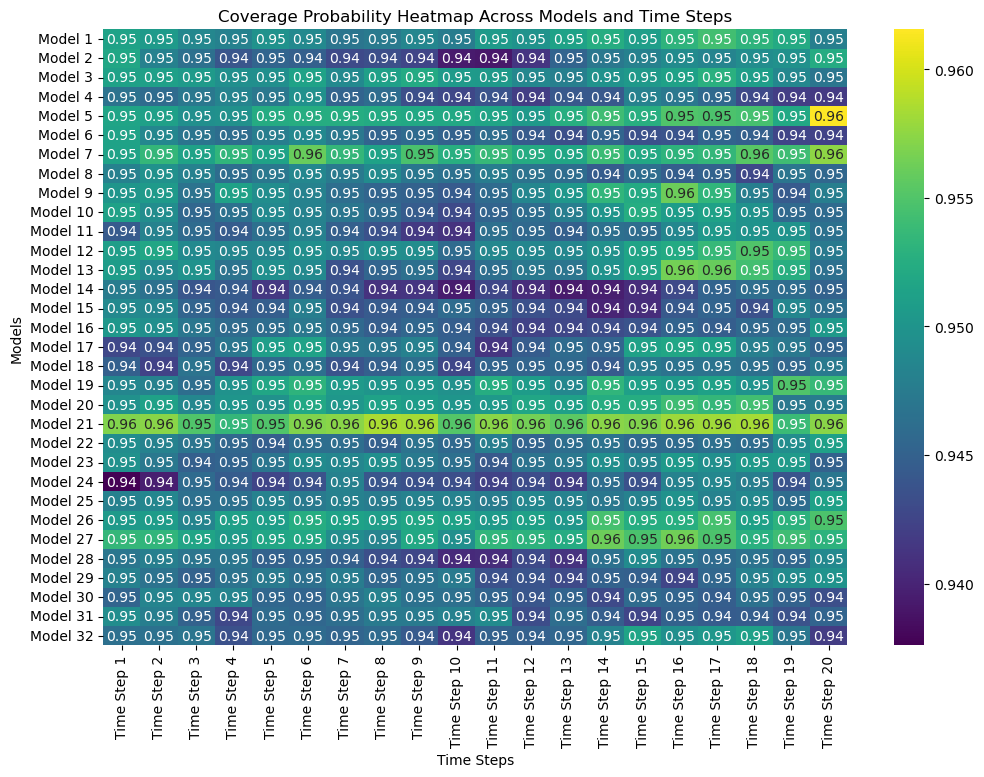

In [136]:
modelThresholds = np.array(modelThresholds) # Shape: (n_models, n_sequences, pointTotal)  
# Calculate coverage probability for each model and time step  
coverage_probabilities = np.mean(modelThresholds, axis=1) # Shape: (n_models, pointTotal)  
# Plotting the heatmap  
plt.figure(figsize=(12, 8))  

sns.heatmap(coverage_probabilities, annot=True, cmap='viridis', cbar=True,  
            xticklabels=[f'Time Step {i+1}' for i in range(pointTotal)],  
            yticklabels=[f'Model {i+1}' for i in range(len(model_paths))])  

plt.xlabel('Time Steps')  
plt.ylabel('Models')  
plt.title('Coverage Probability Heatmap Across Models and Time Steps')  

plt.show() 

#### Confidence Interval

##### Confidence Interval - first approach

In [137]:
import numpy as np
import scipy.stats as stats
def calculate_confidence_interval(data,confidence_level=0.95):
    """Calculate the confidence interval for a given dataset."""
    n=len(data)
    mean_value=np.mean(data)
    std_dev=np.std(data,axis=0,ddof=1)  #Use ddof=1 for sample standard deviation
    se=std_dev/np.sqrt(n)  #Standard error
    t_score=stats.t.ppf((1+confidence_level)/2,n-1)  #Degrees of freedom=n-1
    #Compute the confidence interval bounds
    lower_bound=mean_value-t_score*se
    upper_bound=mean_value+t_score*se
    return lower_bound,upper_bound


#Initialize variables for anomaly detection and accuracy calculation
sequence_anomalies={}
time_step_accuracies_CI=[]
#Loop over all time steps
num_time_steps=len(y_test_inv[0])  #Total number of time steps


for time_step in range(num_time_steps):
    print(f"\nConfidence Interval Calculation for Time Step {time_step+1}")
    #Track anomalies and accuracy for this time step
    total_sequences=len(y_pred_inv_list)
    success_count_dLat=0
    success_count_dLong=0
    for seqNo in range(total_sequences):  #Loop over all sequences
        modelPreds_dLat=[]
        modelPreds_dLong=[]
        #Collect predictions from all models for this sequence and time step
        for model_path in model_paths:
            pred_dLat,pred_dLong=modelSeq[model_path][seqNo][time_step]
            modelPreds_dLat.append(pred_dLat)
            modelPreds_dLong.append(pred_dLong)
        #Calculate confidence intervals for dLat and dLong
        low_dLat,up_dLat=calculate_confidence_interval(modelPreds_dLat,confidence_level=0.95)
        low_dLong,up_dLong=calculate_confidence_interval(modelPreds_dLong,confidence_level=0.95)
        #Check if the actual values fall within the confidence intervals
        actual_dLat,actual_dLong=y_test_inv[seqNo][time_step]
        #dLat Accuracy Check
        if low_dLat<=actual_dLat<=up_dLat:
            success_count_dLat+=1
        #dLong Accuracy Check
        if low_dLong<=actual_dLong<=up_dLong:
            success_count_dLong+=1
    #Calculate accuracy percentages for this time step
    accuracy_dLat=(success_count_dLat/total_sequences)*100
    accuracy_dLong=(success_count_dLong/total_sequences)*100
    print(f"Time Step {time_step+1} - dLat Accuracy: {accuracy_dLat:.2f}%, dLong Accuracy: {accuracy_dLong:.2f}%")
    #Store accuracy for this time step
    time_step_accuracies_CI.append((accuracy_dLat,accuracy_dLong))




#Calculate overall accuracy across all time steps
overall_accuracy_dLat=sum(avg[0]for avg in time_step_accuracies_CI)/num_time_steps
overall_accuracy_dLong=sum(avg[1]for avg in time_step_accuracies_CI)/num_time_steps
print(f"\nOverall CI Accuracy for dLat Across All Time Steps: {overall_accuracy_dLat:.2f}%")
print(f"Overall CI Accuracy for dLong Across All Time Steps: {overall_accuracy_dLong:.2f}%")



Confidence Interval Calculation for Time Step 1
Time Step 1 - dLat Accuracy: 15.71%, dLong Accuracy: 17.36%

Confidence Interval Calculation for Time Step 2
Time Step 2 - dLat Accuracy: 15.20%, dLong Accuracy: 16.40%

Confidence Interval Calculation for Time Step 3
Time Step 3 - dLat Accuracy: 15.21%, dLong Accuracy: 16.50%

Confidence Interval Calculation for Time Step 4
Time Step 4 - dLat Accuracy: 15.54%, dLong Accuracy: 16.49%

Confidence Interval Calculation for Time Step 5
Time Step 5 - dLat Accuracy: 15.08%, dLong Accuracy: 16.27%

Confidence Interval Calculation for Time Step 6
Time Step 6 - dLat Accuracy: 14.83%, dLong Accuracy: 15.76%

Confidence Interval Calculation for Time Step 7
Time Step 7 - dLat Accuracy: 14.73%, dLong Accuracy: 15.66%

Confidence Interval Calculation for Time Step 8
Time Step 8 - dLat Accuracy: 14.61%, dLong Accuracy: 15.52%

Confidence Interval Calculation for Time Step 9
Time Step 9 - dLat Accuracy: 14.67%, dLong Accuracy: 15.44%

Confidence Interva

##### Confidence Interval - 2nd approach

In [37]:
import numpy as np
import scipy.stats as stats
from scipy.stats import t

def calculate_confidence_interval(data, confidence_level=0.95):
    n = len(data)
    mean_value = np.mean(data)
    std_dev = np.std(data, axis=0, ddof=1)  # Use ddof=1 for sample standard deviation
    se = std_dev / np.sqrt(n)  # Standard error
    t_score = stats.t.ppf((1 + confidence_level) / 2, n - 1)  # Corrected: degrees of freedom as positional argument

    # Compute the confidence interval bounds
    lower_bound = mean_value - t_score * se
    upper_bound = mean_value + t_score * se

    return lower_bound, upper_bound

def calculate_coverage_probability(actuals, lowerBounds, upperBounds):
    """
    Calculate the coverage probability given actual values and their lower and upper bounds.

    Parameters:
        actuals (list): A list of actual values.
        lowerBounds (list): A list of lower bounds corresponding to the actual values.
        upperBounds (list): A list of upper bounds corresponding to the actual values.

    Returns:
        float: The coverage probability as a fraction.
    """
    # Ensure the input lists have the same length
    if not (len(actuals) == len(lowerBounds) == len(upperBounds)):
        raise ValueError("All input lists must have the same length.")

    covered = 0
    total = len(actuals)

    # Iterate over all values
    for actual, lower, upper in zip(actuals, lowerBounds, upperBounds):
        # Check if the actual value lies within bounds
        if lower <= actual <= upper:
            covered += 1

    # Calculate and return the coverage probability
    return covered / total if total > 0 else 0.0

# Function to calculate coverage probability given confidence intervals
def coverage_probability_with_intervals(true_values, lower_bounds, upper_bounds):
    count = 0
    num_intervals = len(lower_bounds)
    # print(num_intervals)

    for i in range(num_intervals):
        # print(i)
        if lower_bounds[i] <= true_values[i] <= upper_bounds[i]:
            count += 1

    return count / num_intervals

sample_size = len(glob.glob('models/model_*.keras'))

tempStopSeq = 5

seqConfBounds_dLat = {}
seqConfBounds_dLong = {}

actual_dLat_List = []
actual_dLong_List = []

# Loop over all sequences
# for seqNo in range(0, tempStopSeq):
for seqNo in range(len(y_pred_inv_list)): 
    print(f"\nPrediction & Confidence Interval Calculation for Sequence {seqNo+1}")

    modelPreds_dLat = []
    modelPreds_dLong = []

    actual_dLat_dLong = y_test_inv[seqNo][-1]
    lastActualPT_dLat, lastActualPT_dLong = actual_dLat_dLong
    actual_dLat_List.append(lastActualPT_dLat)
    actual_dLong_List.append(lastActualPT_dLong)

    # Loop over all Models Predictions
    for model_path in model_paths:
        # print(f"\nLoading model from {model_path}")
        lastPt = modelSeq[model_path][seqNo][-1] # Get Last Predicted dLat, dLong
        lastPT_dLat, lastPT_dLong = lastPt
        # print(f"Last Predicted dLat: {lastPT_dLat}, dLong: {lastPT_dLong}")

        # Store Predicted dLat, dLong for Variance Calc.
        modelPreds_dLat.append(lastPT_dLat)
        modelPreds_dLong.append(lastPT_dLong)

    low_up_dLat_conf = calculate_confidence_interval(modelPreds_dLat, confidence_level=0.95)
    low_up_dLong_conf = calculate_confidence_interval(modelPreds_dLong, confidence_level=0.95)
    seqConfBounds_dLat[seqNo+1] = low_up_dLat_conf
    seqConfBounds_dLong[seqNo+1] = low_up_dLong_conf

    lowerBounds = {key: bounds[0] for key, bounds in seqConfBounds_dLat.items()}
    lowerBounds = list(lowerBounds.values())

    upperBounds = {key: bounds[1] for key, bounds in seqConfBounds_dLat.items()}
    upperBounds = list(upperBounds.values())

    lowerBoundsx = {key: bounds[0] for key, bounds in seqConfBounds_dLong.items()}
    lowerBoundsx = list(lowerBoundsx.values())

    upperBoundsx = {key: bounds[1] for key, bounds in seqConfBounds_dLong.items()}
    upperBoundsx = list(upperBoundsx.values())



Prediction & Confidence Interval Calculation for Sequence 1

Prediction & Confidence Interval Calculation for Sequence 2

Prediction & Confidence Interval Calculation for Sequence 3

Prediction & Confidence Interval Calculation for Sequence 4

Prediction & Confidence Interval Calculation for Sequence 5

Prediction & Confidence Interval Calculation for Sequence 6

Prediction & Confidence Interval Calculation for Sequence 7

Prediction & Confidence Interval Calculation for Sequence 8

Prediction & Confidence Interval Calculation for Sequence 9

Prediction & Confidence Interval Calculation for Sequence 10

Prediction & Confidence Interval Calculation for Sequence 11

Prediction & Confidence Interval Calculation for Sequence 12

Prediction & Confidence Interval Calculation for Sequence 13

Prediction & Confidence Interval Calculation for Sequence 14

Prediction & Confidence Interval Calculation for Sequence 15

Prediction & Confidence Interval Calculation for Sequence 16

Prediction & Con

In [ ]:
lowerBounds = {key: bounds[0] for key, bounds in seqConfBounds_dLat.items()}
lowerBounds = list(lowerBounds.values())

upperBounds = {key: bounds[1] for key, bounds in seqConfBounds_dLat.items()}
upperBounds = list(upperBounds.values())

lowerBoundsx = {key: bounds[0] for key, bounds in seqConfBounds_dLong.items()}
lowerBoundsx = list(lowerBoundsx.values())

upperBoundsx = {key: bounds[1] for key, bounds in seqConfBounds_dLong.items()}
upperBoundsx = list(upperBoundsx.values())


In [40]:
calculate_coverage_probability(actual_dLat_List, lowerBounds, upperBounds)

0.10220947883285546

In [39]:
coverage_probability_with_intervals(actual_dLong_List, lowerBoundsx, upperBoundsx)

0.16857817507168157

##### Confidence Interval -  3rd approach

In [41]:

def calculate_confidence_interval(data, confidence_level=0.95):
    n = len(data)
    mean_value = np.mean(data)
    std_dev = np.std(data, axis=0, ddof=1)  # Use ddof=1 for sample standard deviation
    se = std_dev / np.sqrt(n)  # Standard error
    t_score = stats.t.ppf((1 + confidence_level) / 2, n - 1)  # Corrected: degrees of freedom as positional argument

    # Compute the confidence interval bounds
    lower_bound = mean_value - t_score * se
    upper_bound = mean_value + t_score * se

    return lower_bound, upper_bound


sample_size = len(glob.glob('models/model_*.keras'))

#tempStopSeq = 10

up_low_dLat_Conf_Dict = {}
up_low_dLong_Conf_Dict = {}


dLatCountConfList = []
dLongCountConfList = []

# Loop over all sequences
# for seqNo in range(0, tempStopSeq):
for seqNo in range(len(y_pred_inv_list)): 
    print(f"\nConfidence Interval Calculation for Sequence {seqNo+1}")

    modelPreds_dLat = []
    modelPreds_dLong = []

    # Loop over all Models Predictions
    for model_path in model_paths:
        # print(f"\nLoading model from {model_path}")
        lastPt = modelSeq[model_path][seqNo][-1] # Get Last Predicted dLat, dLong
        lastPT_dLat, lastPT_dLong = lastPt
        # print(f"Last Predicted dLat: {lastPT_dLat}, dLong: {lastPT_dLong}")

        # Store Predicted dLat, dLong for Variance Calc.
        modelPreds_dLat.append(lastPT_dLat)
        modelPreds_dLong.append(lastPT_dLong)

    # Calculate Mean and Variance
    mean_dLat = np.mean(modelPreds_dLat)
    mean_dLong = np.mean(modelPreds_dLong)
    variance_dLat = np.var(modelPreds_dLat)
    variance_dLong = np.var(modelPreds_dLong)

    # Calculate Upper & Lower Bounds
    trueCount_dLat_conf = 0
    falseCount_dLat_conf = 0
    trueCount_dLong_conf = 0
    falseCount_dLong_conf = 0

    model_up_low_dLat_Conf_List = []
    model_up_low_dLong_Conf_List = []

    for pred_dLat, pred_dLong in zip(modelPreds_dLat, modelPreds_dLong):
        # Calculate Confidence Interval for dLat and dLong
        up_low_dLat_conf = calculate_confidence_interval(modelPreds_dLat, confidence_level=0.95)
        up_low_dLong_conf = calculate_confidence_interval(modelPreds_dLong, confidence_level=0.95)

        # # Calculate Confidence Interval for dLat and dLong
        # up_low_dLat_conf = calculate_confidence_interval(mean_dLat, variance_dLat, sample_size, confidence_level=0.95)
        # up_low_dLong_conf = calculate_confidence_interval(mean_dLong, variance_dLong, sample_size, confidence_level=0.95)


        low_dLat_conf = pred_dLat - up_low_dLat_conf[0]
        up_dLat_conf = pred_dLat + up_low_dLat_conf[1]

        low_dLong_conf = pred_dLong - up_low_dLong_conf[0]
        up_dLong_conf = pred_dLong + up_low_dLong_conf[1]

        model_up_low_dLat_Conf_List.append(up_low_dLat_conf)
        model_up_low_dLong_Conf_List.append(up_low_dLong_conf)


        # Check if Actual Lies in Upper & Lower Bounds
        actual_dLat, actual_dLong = y_test_inv[seqNo][-1]

        if low_dLat_conf <= actual_dLat <= up_dLat_conf:
            trueCount_dLat_conf += 1
        else:
            falseCount_dLat_conf += 1

        if low_dLong_conf <= actual_dLong <= up_dLong_conf:
            trueCount_dLong_conf += 1
        else:
            falseCount_dLong_conf += 1


    up_low_dLat_Conf_Dict[seqNo + 1] = model_up_low_dLat_Conf_List
    up_low_dLong_Conf_Dict[seqNo + 1] = model_up_low_dLong_Conf_List

    print(f"\nFor dLat, Actual Lies {trueCount_dLat_conf} times out of {sample_size} in Between Upper and Lower Confidence Bounds!")
    print(f"For dLong, Actual Lies {trueCount_dLong_conf} times out of {sample_size} in Between Upper and Lower Confidence Bounds!")

    dLatCountConfList.append(trueCount_dLat_conf)
    dLongCountConfList.append(trueCount_dLong_conf)


Confidence Interval Calculation for Sequence 1

For dLat, Actual Lies 20 times out of 32 in Between Upper and Lower Confidence Bounds!
For dLong, Actual Lies 31 times out of 32 in Between Upper and Lower Confidence Bounds!

Confidence Interval Calculation for Sequence 2

For dLat, Actual Lies 0 times out of 32 in Between Upper and Lower Confidence Bounds!
For dLong, Actual Lies 2 times out of 32 in Between Upper and Lower Confidence Bounds!

Confidence Interval Calculation for Sequence 3

For dLat, Actual Lies 32 times out of 32 in Between Upper and Lower Confidence Bounds!
For dLong, Actual Lies 11 times out of 32 in Between Upper and Lower Confidence Bounds!

Confidence Interval Calculation for Sequence 4

For dLat, Actual Lies 32 times out of 32 in Between Upper and Lower Confidence Bounds!
For dLong, Actual Lies 26 times out of 32 in Between Upper and Lower Confidence Bounds!

Confidence Interval Calculation for Sequence 5

For dLat, Actual Lies 0 times out of 32 in Between Upper 

In [42]:
sum(dLatCountConfList)/(sample_size*seqNo) * 100

19.48743358353715

In [43]:
sum(dLongCountConfList)/(sample_size*seqNo) * 100

27.256314835118495

##### Confidence Interval Calculation

In [81]:
import numpy as np
import scipy.stats as stats
from scipy.stats import t

def calculate_confidence_interval(data, confidence_level=0.95):
    n = len(data)
    mean_value = np.mean(data)
    std_dev = np.std(data, axis=0, ddof=1)  # Use ddof=1 for sample standard deviation
    se = std_dev / np.sqrt(n)  # Standard error
    t_score = stats.t.ppf((1 + confidence_level) / 2, n - 1)  # Corrected: degrees of freedom as positional argument

    # Compute the confidence interval bounds
    lower_bound = mean_value - t_score * se
    upper_bound = mean_value + t_score * se

    return lower_bound, upper_bound

sample_size = len(glob.glob('models/model_*.keras'))

#tempStopSeq = 10

up_low_dLat_Conf_Dict = {}
up_low_dLong_Conf_Dict = {}

dLatCountConfList = []
dLongCountConfList = []
seqConfBounds_dLat = {}
seqConfBounds_dLong = {}

for seqNo in range(len(y_pred_inv_list)): 
    modelPreds_dLat = []
    modelPreds_dLong = []
    
    # Loop over all Models Predictions
    for model_path in model_paths:
       
        lastPt = modelSeq[model_path][seqNo][-1] # Get Last Predicted dLat, dLong
        lastPT_dLat, lastPT_dLong = lastPt
        
        # Store Predicted dLat, dLong for Variance Calc.
        modelPreds_dLat.append(lastPT_dLat)
        modelPreds_dLong.append(lastPT_dLong)

    up_low_dLat_conf = calculate_confidence_interval(modelPreds_dLat, confidence_level=0.95)
    up_low_dLong_conf = calculate_confidence_interval(modelPreds_dLong, confidence_level=0.95)
    seqConfBounds_dLat[seqNo+1] = up_low_dLat_conf
    seqConfBounds_dLong[seqNo+1] = up_low_dLong_conf


In [70]:
print(f"\n Dlat Confidence Interval boundaries for all sequences")
seqConfBounds_dLat


 Dlat Confidence Interval boundaries for all sequences


{1: (0.07140512023930794, 0.08939268435473198),
 2: (-0.04241536073172117, -0.0005863208345172344),
 3: (0.131362009050822, 0.1552535116648915),
 4: (0.07903233279248434, 0.09930977116564554),
 5: (-0.063650771852576, -0.04470984650031401),
 6: (-0.05930057903800536, -0.04261177042450379),
 7: (0.13101544462761436, 0.15388313449302163),
 8: (-0.04884089294407152, -0.028266216185357344),
 9: (-0.037441404777133785, 0.008161710815990295),
 10: (0.03704239688107296, 0.05330359675696567),
 11: (0.03771949557161849, 0.05893961342477281),
 12: (0.05562968782970003, 0.07333005733898589),
 13: (0.08147800538365012, 0.1085459532993638),
 14: (0.04628382507417069, 0.06455646571066512),
 15: (-0.05504321126479912, -0.03870731027584266),
 16: (-0.06508810532797597, -0.023631359510528818),
 17: (-0.04884846746724026, -0.029930827619620397),
 18: (0.057013590502226055, 0.07352838976434499),
 19: (0.09002792252248507, 0.11162758456522245),
 20: (0.05302515311056971, 0.08612546639626623),
 21: (0.0119

In [71]:
print(f"\n Dlong Confidence Interval boundaries for all sequences")
seqConfBounds_dLong


 Dlong Confidence Interval boundaries for all sequences


{1: (0.19283838547565946, 0.26001946650645724),
 2: (-0.011160984574508759, 0.11346748465175638),
 3: (0.2111154885588368, 0.2827285437287609),
 4: (0.1688233904995018, 0.23782622884139482),
 5: (-0.04776037492335078, 0.022167060603501765),
 6: (-0.050987075364471196, 0.02342758449006152),
 7: (0.22419238243123948, 0.2973493322370344),
 8: (-0.007505829153994607, 0.05959029745910554),
 9: (-0.006201486126565348, 0.12985366119542063),
 10: (0.16222550564318383, 0.2258519322344712),
 11: (0.1807482639248298, 0.2515461048190667),
 12: (0.15692257263588483, 0.2235564651258034),
 13: (0.22743651006897736, 0.31125757362166595),
 14: (0.17990416299496503, 0.24947065103854327),
 15: (-0.08151151352890491, -0.021140969159522058),
 16: (-0.08557926586794955, 0.05580325893092257),
 17: (-0.14479397038442782, -0.08188988467233488),
 18: (0.17149021890987243, 0.23588607045780335),
 19: (0.1756735546752356, 0.24593924449239746),
 20: (0.2165855514909449, 0.31292744995101063),
 21: (0.040380735656091

##### Confidence Interval - 4th approach

In [85]:
### Confidence Interval Calculation OLD Approach
import numpy as np
import scipy.stats as stats
from scipy.stats import t

def calculate_confidence_interval(data, confidence_level=0.95):
    n = len(data)
    mean_value = np.mean(data)
    std_dev = np.std(data, axis=0, ddof=1)  # Use ddof=1 for sample standard deviation
    se = std_dev / np.sqrt(n)  # Standard error
    t_score = stats.t.ppf((1 + confidence_level) / 2, n - 1)  # Corrected: degrees of freedom as positional argument

    # Compute the confidence interval bounds
    lower_bound = mean_value - t_score * se
    upper_bound = mean_value + t_score * se

    return lower_bound, upper_bound

# def calculate_confidence_interval(mean_value, variance, sample_size, confidence_level=0.95):
#     """
#     Calculate the confidence interval for a given mean value.

#     Parameters:
#     - mean_value: float, the mean value of the variable.
#     - variance: float, variance of the variable.
#     - sample_size: int, the number of samples in the dataset.
#     - confidence_level: float, the desired confidence level (default is 0.95).

#     Returns:
#     - (lower_bound, upper_bound): tuple, the confidence interval bounds.
#     """
#     # Degrees of freedom
#     degrees_of_freedom = sample_size - 1

#     # Critical t-value
#     t_critical = stats.t.ppf((1 + confidence_level) / 2, degrees_of_freedom)

#     # Standard error of the mean
#     std_error_mean = np.sqrt(variance / sample_size)

#     # Compute the confidence interval bounds
#     lower_bound = mean_value - t_critical * std_error_mean
#     upper_bound = mean_value + t_critical * std_error_mean

#     return lower_bound, upper_bound

sample_size = len(glob.glob('models/model_*.keras'))

tempStopSeq = 10

up_low_dLat_Conf_Dict = {}
up_low_dLong_Conf_Dict = {}


dLatCountConfList = []
dLongCountConfList = []

seqConfBounds_dLat = {}
seqConfBounds_dLong = {}

# Loop over all sequences
# for seqNo in range(0, tempStopSeq):
for seqNo in range(len(y_pred_inv_list)): 
    print(f"\n Confidence Interval Calculation for Sequence {seqNo+1}")

    modelPreds_dLat = []
    modelPreds_dLong = []

    # Loop over all Models Predictions
    for model_path in model_paths:
        # print(f"\nLoading model from {model_path}")
        lastPt = modelSeq[model_path][seqNo][-1] # Get Last Predicted dLat, dLong
        lastPT_dLat, lastPT_dLong = lastPt
        # print(f"Last Predicted dLat: {lastPT_dLat}, dLong: {lastPT_dLong}")

        # Store Predicted dLat, dLong for Variance Calc.
        modelPreds_dLat.append(lastPT_dLat)
        modelPreds_dLong.append(lastPT_dLong)

    # Calculate Mean and Variance
    mean_dLat = np.mean(modelPreds_dLat)
    mean_dLong = np.mean(modelPreds_dLong)
    variance_dLat = np.var(modelPreds_dLat)
    variance_dLong = np.var(modelPreds_dLong)

    # Calculate Upper & Lower Bounds
    trueCount_dLat_conf = 0
    falseCount_dLat_conf = 0
    trueCount_dLong_conf = 0
    falseCount_dLong_conf = 0

    model_up_low_dLat_Conf_List = []
    model_up_low_dLong_Conf_List = []

    # up_low_dLat_conf = calculate_confidence_interval(modelPreds_dLat, confidence_level=0.95)
    # up_low_dLong_conf = calculate_confidence_interval(modelPreds_dLong, confidence_level=0.95)
    # seqConfBounds_dLat[seqNo+1] = up_low_dLat_conf
    # seqConfBounds_dLong[seqNo+1] = up_low_dLong_conf

    for pred_dLat, pred_dLong in zip(modelPreds_dLat, modelPreds_dLong):
        # Calculate Confidence Interval for dLat and dLong
        up_low_dLat_conf = calculate_confidence_interval(modelPreds_dLat, confidence_level=0.95)
        up_low_dLong_conf = calculate_confidence_interval(modelPreds_dLong, confidence_level=0.95)

        # # Calculate Confidence Interval for dLat and dLong
        # up_low_dLat_conf = calculate_confidence_interval(mean_dLat, variance_dLat, sample_size, confidence_level=0.95)
        # up_low_dLong_conf = calculate_confidence_interval(mean_dLong, variance_dLong, sample_size, confidence_level=0.95)


        low_dLat_conf = pred_dLat - up_low_dLat_conf[0]
        up_dLat_conf = pred_dLat + up_low_dLat_conf[1]

        low_dLong_conf = pred_dLong - up_low_dLong_conf[0]
        up_dLong_conf = pred_dLong + up_low_dLong_conf[1]

        model_up_low_dLat_Conf_List.append([low_dLat_conf, up_dLat_conf])
        model_up_low_dLong_Conf_List.append([low_dLong_conf, up_dLong_conf])


        # Check if Actual Lies in Upper & Lower Bounds
        actual_dLat, actual_dLong = y_test_inv[seqNo][-1]

        if low_dLat_conf <= actual_dLat <= up_dLat_conf:
            trueCount_dLat_conf += 1
        else:
            falseCount_dLat_conf += 1

        if low_dLong_conf <= actual_dLong <= up_dLong_conf:
            trueCount_dLong_conf += 1
        else:
            falseCount_dLong_conf += 1

    up_low_dLat_Conf_Dict[seqNo + 1] = model_up_low_dLat_Conf_List
    up_low_dLong_Conf_Dict[seqNo + 1] = model_up_low_dLong_Conf_List

    print(f"\nFor dLat, Actual Lies {trueCount_dLat_conf} times out of {sample_size} in Between Upper and Lower Confidence Bounds!")
    print(f"For dLong, Actual Lies {trueCount_dLong_conf} times out of {sample_size} in Between Upper and Lower Confidence Bounds!")

    dLatCountConfList.append(trueCount_dLat_conf)
    dLongCountConfList.append(trueCount_dLong_conf)
sum(dLatCountConfList)/(sample_size*seqNo)
sum(dLongCountConfList)/(sample_size*seqNo)


 Confidence Interval Calculation for Sequence 1

For dLat, Actual Lies 20 times out of 32 in Between Upper and Lower Confidence Bounds!
For dLong, Actual Lies 31 times out of 32 in Between Upper and Lower Confidence Bounds!

 Confidence Interval Calculation for Sequence 2

For dLat, Actual Lies 0 times out of 32 in Between Upper and Lower Confidence Bounds!
For dLong, Actual Lies 2 times out of 32 in Between Upper and Lower Confidence Bounds!

 Confidence Interval Calculation for Sequence 3

For dLat, Actual Lies 32 times out of 32 in Between Upper and Lower Confidence Bounds!
For dLong, Actual Lies 11 times out of 32 in Between Upper and Lower Confidence Bounds!

 Confidence Interval Calculation for Sequence 4

For dLat, Actual Lies 32 times out of 32 in Between Upper and Lower Confidence Bounds!
For dLong, Actual Lies 26 times out of 32 in Between Upper and Lower Confidence Bounds!

 Confidence Interval Calculation for Sequence 5

For dLat, Actual Lies 0 times out of 32 in Between U

0.27256314835118495

In [86]:
sum(dLatCountConfList)/(sample_size*seqNo)

0.1948743358353715

In [87]:
sum(dLongCountConfList)/(sample_size*seqNo)

0.27256314835118495

##### VIZ

Randomly selected time step: 20
Randomly selected sequences: [7053, 2606, 4281, 6811, 7206, 11670, 6029, 720, 7653, 3120, 9132, 7838, 8251, 4186, 3464, 5876, 10516, 3429, 9112, 8503, 10654, 10790, 3269, 3496, 826, 8312, 9567, 6677, 11734, 971, 6397, 1504, 3798, 8086, 1235, 2097, 523, 3454, 3535, 6922, 1264, 11828, 11137, 4911, 8718, 8218, 5141, 11240, 9885, 9466, 8740, 3110, 3138, 8124, 4261, 3389, 7891, 10200, 10113, 1592, 10515, 7444, 11238, 3726, 1547, 5584, 9778, 2974, 313, 2664, 9257, 5756, 10291, 8757, 3611, 7032, 93, 11668, 9681, 6565, 7807, 4279, 11191, 10682, 9144, 3455, 1694, 6429, 4226, 5974, 6589, 5337, 11815, 7375, 10248, 5286, 810, 4493, 8196, 10955]


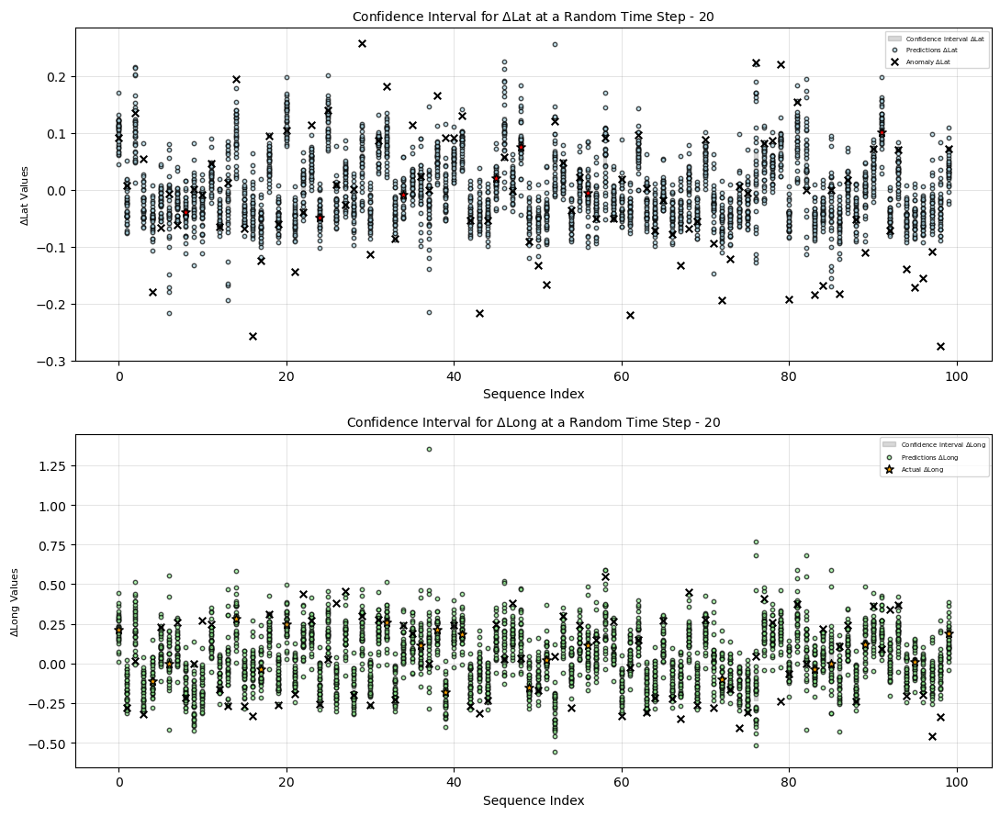

In [191]:

def calculate_confidence_interval(data):
    """Calculate the confidence interval for a list of data points."""
    mean = sum(data) / len(data)
    variance = sum((x - mean) ** 2 for x in data) / len(data)
    stddev = variance ** 0.5
    margin_of_error = 1.96 * (stddev / (len(data) ** 0.5))
    return mean - margin_of_error, mean + margin_of_error

def visualize_random_CI(num_random_sequences, sample_size, modelSeq, y_test_inv):
    """
    Visualize confidence intervals, model predictions, and actuals for ΔLat and ΔLong
    for a randomly selected time step across randomly selected sequences.

    Parameters:
    - num_random_sequences: Number of random sequences to visualize
    - sample_size: Number of models
    - modelSeq: Dictionary containing model predictions for each sequence and time step
    - y_test_inv: List of actual values for each sequence and time step
    """
    # Randomly select a time step
    num_time_steps = len(y_test_inv[0])
    target_time_step = 19#random.randint(0, num_time_steps - 1)
    print(f"Randomly selected time step: {target_time_step + 1}")

    # Randomly select sequences
    random_sequences = random.sample(range(len(y_test_inv)), num_random_sequences)
    print(f"Randomly selected sequences: {random_sequences}")

    # Containers for visualization
    CI_dLat = []  # Confidence intervals for ΔLat
    predictions_dLat = []
    actuals_dLat = []

    CI_dLong = []  # Confidence intervals for ΔLong
    predictions_dLong = []
    actuals_dLong = []

    # Gather data for visualization
    for seq in random_sequences:
        preds_dLat = []
        preds_dLong = []

        for model_path in model_paths:
            pred_dLat, pred_dLong = modelSeq[model_path][seq][target_time_step]
            preds_dLat.append(pred_dLat)
            preds_dLong.append(pred_dLong)

        # Calculate confidence intervals
        low_dLat, up_dLat = calculate_confidence_interval(preds_dLat)
        low_dLong, up_dLong = calculate_confidence_interval(preds_dLong)
        CI_dLat.append((low_dLat, up_dLat))
        CI_dLong.append((low_dLong, up_dLong))

        # Store model predictions and actual values
        predictions_dLat.append(preds_dLat)
        predictions_dLong.append(preds_dLong)
        actuals_dLat.append(y_test_inv[seq][target_time_step][0])
        actuals_dLong.append(y_test_inv[seq][target_time_step][1])

    # Create subplots for ΔLat and ΔLong visualizations side by side
    #fig, axs = plt.subplots(1, 2, figsize=(20, 5))
    fig, axs = plt.subplots(2, 1, figsize=(11, 9))
    
    # Plot ΔLat visualization
    for i, (low, up) in enumerate(CI_dLat):
        axs[0].fill_between([i - 0.2, i + 0.2], [low], [up], color="gray", alpha=0.3, label=r"Confidence Interval $\Delta$Lat" if i == 0 else "")
    
    for i, preds in enumerate(predictions_dLat):
        axs[0].scatter([i] * len(preds), preds, alpha=0.7, color="lightblue", edgecolors="black", s=10, label=r"Predictions $\Delta$Lat" if i == 0 else "")
    
    for i, actual in enumerate(actuals_dLat):
        if actual < CI_dLat[i][0] or actual > CI_dLat[i][1]:
            axs[0].scatter([i], [actual], color="black", marker="x", s=30, label=r"Anomaly $\Delta$Lat" if i == 0 else "")
        else:
            axs[0].scatter([i], [actual], color="red", marker="*", s=50, edgecolors="black", label=r"Actual $\Delta$Lat" if i == 0 else "")
    
    axs[0].set_title(rf"Confidence Interval for $\Delta$Lat at a Random Time Step - {target_time_step + 1}", fontsize=10)
    axs[0].set_xlabel("Sequence Index", fontsize=10)
    axs[0].set_ylabel(r"$\Delta$Lat Values", fontsize=8)
    axs[0].legend(fontsize=5) 
    axs[0].grid(color='gray', linestyle='-', linewidth=0.5, alpha=0.3)

    # Plot ΔLong visualization
    for i, (low, up) in enumerate(CI_dLong):
        axs[1].fill_between([i - 0.2, i + 0.2], [low], [up], color="gray", alpha=0.3, label=r"Confidence Interval $\Delta$Long" if i == 0 else "")
    
    for i, preds in enumerate(predictions_dLong):
        axs[1].scatter([i] * len(preds), preds, alpha=0.7, color="lightgreen", edgecolors="black", s=10, label=r"Predictions $\Delta$Long" if i == 0 else "")
    
    for i, actual in enumerate(actuals_dLong):
        if actual < CI_dLong[i][0] or actual > CI_dLong[i][1]:
            axs[1].scatter([i], [actual], color="black", marker="x", s=30, label=r"Anomaly $\Delta$Long" if i == 0 else "")
        else:
            axs[1].scatter([i], [actual], color="orange", marker="*", s=50, edgecolors="black", label=r"Actual $\Delta$Long" if i == 0 else "")
    
    axs[1].set_title(rf"Confidence Interval for $\Delta$Long at a Random Time Step - {target_time_step + 1}", fontsize=10)
    axs[1].set_xlabel("Sequence Index", fontsize=10)
    axs[1].set_ylabel(r"$\Delta$Long Values", fontsize=8)
    axs[1].legend(fontsize=5) 
    axs[1].grid(color='gray', linestyle='-', linewidth=0.5, alpha=0.3)

    plt.tight_layout()
    plt.show()

# Example: Visualize for 100 random sequences
num_random_sequences = 100

# Assuming modelSeq and y_test_inv are defined elsewhere in the code
visualize_random_CI(num_random_sequences, sample_size, modelSeq, y_test_inv)